# NYC's Worst-Performing Subway Lines Through Comprehensive EDA

# Table of Contents

1. [Project Goals](#1-project-goals)
2. [Datasets Used](#2-datasets-used)
3. [Libraries and Setup](#3-libraries-and-setup)
4. [Data Cleaning and Preparation](#4-data-cleaning-and-preparation)
   - 4.1 [Major Incidents Data](#41-major-incidents-data)
   - 4.2 [Delays Data](#42-delays-data)
   - 4.3 [Customer Journey Metrics Data](#43-customer-journey-metrics-data)
5. [Merging Datasets](#5-merging-datasets)
   - 5.1 [Merge Incidents and Delays Data](#51-merge-incidents-and-delays-data)
   - 5.2 [Merge with Customer Journey Metrics](#52-merge-with-customer-journey-metrics)
6. [Custom Plotting Functions](#6-custom-plotting-functions)
7. [Exploratory Data Analysis (EDA)](#7-exploratory-data-analysis-eda)
   - 7.1 [Initial Observations](#71-initial-observations)
   - 7.2 [Passengers](#72-passengers)
      - 7.2.1 [Passengers Distribution](#721-passengers-distribution)
      - 7.2.2 [Number of Passengers by Month](#722-number-of-passengers-by-month)
   - 7.3 [Subway Lines Performance](#73-subway-lines-performance)
      - 7.3.1 [Number of Passengers by Line](#731-number-of-passengers-by-line)
      - 7.3.2 [Delays and Incidents by Line](#732-delays-and-incidents-by-line)
      - 7.3.3 [Normalization of Delays and Incidents](#733-normalization-of-delays-and-incidents)
      - 7.3.4 [Additional Platform Time (APT) by Line](#734-additional-platform-time-apt-by-line)
      - 7.3.5 [Delays and APT Relationship](#735-delays-and-apt-relationship)
      - 7.3.6 [Additional Train Time (ATT) by Line](#736-additional-train-time-att-by-line)
      - 7.3.7 [Passengers Not Completing Journey Within 5 Minutes](#737-passengers-not-completing-journey-within-5-minutes)
8. [Delays](#8-delays)
   - 8.1 [Delays Distribution](#81-delays-distribution)
   - 8.2 [Delays by Day Type](#82-delays-by-day-type)
   - 8.3 [Delays by Month](#83-delays-by-month)
   - 8.4 [Delays by Category](#84-delays-by-category)
   - 8.5 [Delays by Subcategory](#85-delays-by-subcategory)
   - 8.6 [Delays by Line](#86-delays-by-line)
9. [Incidents](#9-incidents)
   - 9.1 [Incidents Distribution](#91-incidents-distribution)
   - 9.2 [Incidents by Day Type](#92-incidents-by-day-type)
   - 9.3 [Incidents by Month](#93-incidents-by-month)
   - 9.4 [Incidents by Category](#94-incidents-by-category)
   - 9.5 [Incidents by Line](#95-incidents-by-line)
10. [Worst-performing Subway Line](#10-worst-performing-subway-line)
    - 10.1 [Normalization of Delays and Incidents by Passenger Volume](#101-normalization-of-delays-and-incidents-by-passenger-volume)
    - 10.2 [Final Rankings Table](#102-final-rankings-table)
    - 10.3 [Visualizations](#103-visualizations)
      - 10.3.1 [Bar Plot](#1031-bar-plot)
      - 10.3.2 [Grouped Chart](#1032-grouped-chart)
      - 10.3.3 [Polar Bar Chart](#1033-polar-bar-chart)
    - 10.4 [Observations](#104-observations)
11. [Key Insights](#11-key-insights)
12. [Final Recommendations](#12-final-recommendations)

# Project goals
If you've ever traveled to New York City, there's a good chance you've used its subway system. It's one of the oldest public transit systems, one of the most-used, and the one with the most stations. The subway carried more than 2 billion riders in 2023. But you also probably faced or at least heard about its many problems - from rat infestation to flooding, crime, train accidents and delays and noticed that some lines seem to function better than others. The subway performance impacts daily lives of millions of people living and visiting NYC and it can reveal important insights into the efficiency and reliability of the city's transit system. 

In this project, my aim is to **conduct a comprehensive Exploratory Data Analysis of MTA subway performance in 2023**. By analyzing three  datasets — focusing on customer journey metrics, train delays, and major incidents — I will **determine which line performed the worst in 2023**. 

Through this analysis, I hope to provide insights that could aid in improving transit efficiency and help riders better understand the system’s challenges.

# Datasets used
In my research, I used these three datasets from data.ny.gov:\
**1. MTA Subway Major Incidents** https://data.ny.gov/Transportation/MTA-Subway-Major-Incidents-Beginning-2020/j6d2-s8m2/abou

| data label | data type| data description |
|:-|:-|:-|
|month | date | Represents the time period in which the Major Incidents are being calculated (month and year).|
|division |text |Represents the A Division (numbered subway lines) and B Division (lettered subway lines). |
|line |text |Represents each subway line (1, 2, 3, 4, 5, 6, 7, A, C, E, B, D, F, M, G, J, Z, L, N, Q, R, W, S 42nd, S Rock, S Fkln). |
|day_type | numeric|Represents weekday as 1, weekend as 2.|
|category | text| The six categories that fall under the definition of a Major Incident: Track, Signals, Persons on Trackbed/Police/Medical, Stations and Structure, Subway Car, and Other.|
|count | numeric| The number of major incidents that occurred per month and per subway line.|

**2. MTA Subway Trains Delayed** https://data.ny.gov/Transportation/MTA-Subway-Trains-Delayed-Beginning-2020/wx2t-qtaz/about_data

| data label | data type| data description |
|:-|:-|:-|
|month | date | Represents the time period in which the Major Incidents are being calculated (month and year).|
|division |text |Represents the A Division (numbered subway lines) and B Division (lettered subway lines). |
|line |text |Represents each subway line (1, 2, 3, 4, 5, 6, 7, A, C, E, B, D, F, M, G, J, Z, L, N, Q, R, W, S 42nd, S Rock, S Fkln). |
|day_type | numeric|Represents weekday as 1, weekend as 2.|
|reporting_category | text| The six categories that delays are reported under: Infrastructure & equipment, Crew availability, Police & medical, External Factors, Operating conditions, Planned ROW work.|
|subcategory | text| The sub-categories that fall under the definition of Delays: Braking; Door-Related; Fire, Smoke, Debris; Inclement Weather; Crew Availability; Insufficient Supplement Schedule; Propulsion; Public Conduct, Crime, Police R esponse; Rail and  Roadbed; Persons on Roadbed; Service Delivery; Sick/Injured Customer; Train Brake Activation – Cause Un known; Subways  Maintenance; Work Equipment; Capital Work - Other Planned ROW; External Debris on Roadbed; External Agency or Utility; Capital Work - Other Planned ROW; Other – CE; Other – Sig; Other Infrastructure; Other Internal Disruptions.|
|delays | numeric| The number of train delays per category and time period.|


**3. MTA Subway Customer Journey-Focused Metrics** https://data.ny.gov/Transportation/MTA-Subway-Customer-Journey-Focused-Metrics-Beginn/4apg-4kt9/about_data

| data label | data type | data description |
|:-|:-|:-|
|month | date | Represents the time period in which the Major Incidents are being calculated (month and year).|
|division |text |Represents the A Division (numbered subway lines) and B Division (lettered subway lines). |
|line |text |Represents each subway line (1, 2, 3, 4, 5, 6, 7, A, C, E, B, D, F, M, G, J, Z, L, N, Q, R, W, S 42nd, S Rock, S Fkln). |
|num_passengers | numeric|Total number of passengers reported each month and on each line. |
|additional platform time | numeric| The average additional time in minutes (above scheduled time) customers wait for their train, reported each month and on each line.|
|additional train time | numeric|The average additional time in minutes (above scheduled time) customers spend onboard a train, reported each month and on each line.|
|total_apt | numeric| The total number of additional time in minutes (above scheduled time) customers wait for their train, reported each month and on each line.|
|total_att |numeric | The total number of average additional time in minutes (above scheduled time) customers spend onboard a train, reported each month and on each line.|
|over_five_mins |numeric | The estimated total number of customers whose journeys are not completed within 5 minutes of the scheduled time, reported each month and on each line|

# Libraries and Setup

In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec
import seaborn as sns
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [2]:
pd.set_option('display.max_colwidth', None)  # Ensures columns don't get truncated
pd.set_option('display.max_rows', None)  # Displays all rows if needed
pd.options.mode.copy_on_write = True

# Data cleaning and preparation

## Major Incidents Data

#### Loading and First Look

In [3]:
# load the dataset
incident = pd.read_csv(r"D:\Documents\! Resume projects\Subway\NYC Subway datasets\MTA_Subway_Major_Incidents_2023.csv")

In [4]:
# have a first look at our data
incident.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 503 entries, 0 to 502
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   month     503 non-null    object
 1   division  503 non-null    object
 2   line      503 non-null    object
 3   day_type  503 non-null    int64 
 4   category  503 non-null    object
 5   count     503 non-null    int64 
dtypes: int64(2), object(4)
memory usage: 23.7+ KB


In [5]:
incident.head()

,month,division,line,day_type,category,count
0,2023-12,A DIVISION,1,1,Track,1
1,2023-12,A DIVISION,1,2,Other,1
2,2023-12,A DIVISION,2,1,Track,1
3,2023-12,A DIVISION,2,1,Signals,1
4,2023-12,A DIVISION,2,1,Persons on Trackbed/Police/Medical,1


### Column Renaming

In [6]:
# rename the 'count' column 
incident.rename(columns = {"count" : "incidents"}, inplace = True)

### Removal of Unnecessary Columns

In [7]:
# first, get rid of systemwide values in the division and line columns
incident = incident[incident["division"]!= "Systemwide"]  

In [8]:
# remove the division column using groupby
incidents = incident.groupby(["month", "line", "day_type", "category"]).agg({"incidents": "sum"}).reset_index()

In [9]:
# let's see what we have now
incidents.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   month      400 non-null    object
 1   line       400 non-null    object
 2   day_type   400 non-null    int64 
 3   category   400 non-null    object
 4   incidents  400 non-null    int64 
dtypes: int64(2), object(3)
memory usage: 15.8+ KB


### Data Type Conversion

**Time**

In [10]:
# change date to datetime
incidents['month'] = pd.to_datetime(incidents['month'])

In [11]:
# change format
incidents['month'] = incidents['month'].dt.strftime('%Y-%m')
incidents['month'] = pd.to_datetime(incidents['month'])

**Other**

In [12]:
# I want to change the data type of some columns to 'category'
incidents = incidents.astype({"line":'category', 
                              "day_type":'category', 
                              "category":'category'}) 

In [13]:
# and check our final data
incidents.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   month      400 non-null    datetime64[ns]
 1   line       400 non-null    category      
 2   day_type   400 non-null    category      
 3   category   400 non-null    category      
 4   incidents  400 non-null    int64         
dtypes: category(3), datetime64[ns](1), int64(1)
memory usage: 8.6 KB


## Delays Data

### Loading and First Look

In [14]:
# load the dataset
delay = pd.read_csv(r"D:\Documents\! Resume projects\Subway\NYC Subway datasets\MTA_Subway_Trains_Delayed_2023.csv")

In [15]:
# have a first look at data
delay.head()

,month,division,line,day_type,reporting_category,subcategory,delays
0,2023-12-01,A DIVISION,1,1,Crew Availability,Crew Availability,221
1,2023-12-01,A DIVISION,1,1,External Factors,External Agency or Utility,13
2,2023-12-01,A DIVISION,1,1,External Factors,External Debris on Roadbed,113
3,2023-12-01,A DIVISION,1,1,Infrastructure & Equipment,Braking,24
4,2023-12-01,A DIVISION,1,1,Infrastructure & Equipment,Door-Related,39


In [16]:
delay.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8395 entries, 0 to 8394
Data columns (total 7 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   month               8395 non-null   object
 1   division            8395 non-null   object
 2   line                8395 non-null   object
 3   day_type            8395 non-null   int64 
 4   reporting_category  8395 non-null   object
 5   subcategory         7912 non-null   object
 6   delays              8395 non-null   int64 
dtypes: int64(2), object(5)
memory usage: 459.2+ KB


### Column Renaming

In [17]:
# rename the 'reporting_category' column
delay.rename(columns = {"reporting_category" : "category"}, inplace = True)

### Removal of Unnecessary Columns

In [18]:
# also get rid of systemwide values in the division and line columns
delay = delay[delay["division"]!= "Systemwide"]  

In [19]:
# remove the division column using groupby
delays = delay.groupby(["month", "line", "day_type", "category", "subcategory"]).agg({"delays": "sum"}).reset_index()

### Data Type Conversion

**Time**

In [20]:
# change date to datetime
delays['month'] = pd.to_datetime(delays['month'])

In [21]:
# change format
delays['month'] = delays['month'].dt.strftime('%Y-%m')
delays['month'] = pd.to_datetime(delays['month'])

**Other**

In [22]:
# change the type of some other columns
delays = delays.astype({"line":'category',
                        "day_type":'category',
                        "category":'category',
                        "subcategory":'category',
                       }) 

In [23]:
# check what we have now
delays.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7768 entries, 0 to 7767
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   month        7768 non-null   datetime64[ns]
 1   line         7768 non-null   category      
 2   day_type     7768 non-null   category      
 3   category     7768 non-null   category      
 4   subcategory  7768 non-null   category      
 5   delays       7768 non-null   int64         
dtypes: category(4), datetime64[ns](1), int64(1)
memory usage: 153.6 KB


## Customer Journey Metrics Data

### Loading and First Look

In [24]:
# load the final dataset
customer = pd.read_csv(r"D:\Documents\! Resume projects\Subway\NYC Subway datasets\MTA_Subway_Customer_Journey-Focused_Metrics_sum.csv")

In [25]:
# have a first look at data
customer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   month                     300 non-null    object 
 1   division                  300 non-null    object 
 2   line                      300 non-null    object 
 3   num_passengers            300 non-null    float64
 4   additional platform time  300 non-null    float64
 5   additional train time     300 non-null    float64
 6   total_apt                 300 non-null    float64
 7   total_att                 300 non-null    float64
 8   over_five_mins            300 non-null    float64
dtypes: float64(6), object(3)
memory usage: 21.2+ KB


In [26]:
pd.options.display.float_format = '{:.2f}'.format
customer.head()

,month,division,line,num_passengers,additional platform time,additional train time,total_apt,total_att,over_five_mins
0,2023-10-01,B DIVISION,E,7882217.30,1.22,0.55,9644643.30,4272768.96,1196163.70
1,2023-10-01,B DIVISION,C,5152103.20,1.60,0.52,8212485.87,2691688.69,999452.70
2,2023-03-01,B DIVISION,E,7840908.80,1.32,0.73,10261936.58,5630795.80,1370830.70
3,2023-05-01,A DIVISION,7,9603416.60,0.89,0.35,8560979.95,3299958.02,1013633.90
4,2023-12-01,B DIVISION,F,9230686.70,1.85,0.45,17077770.46,3985577.44,1957470.00


### Column Renaming

In [27]:
customer.rename(columns = {"additional platform time" : "apt",
                           "additional train time": "att",
                           }, inplace = True)

### Removal of Unnecessary Columns

In [28]:
# only leave the data for each line and get rid of total numbers
customer = customer[customer["division"]!= "Systemwide"]  

In [29]:
# aggregate by chosen columns
customers = customer.groupby(["month", "line"]).agg(
    num_passengers = ("num_passengers", "sum"),
    apt = ("apt", "mean"),
    att = ("att", "mean"),
    total_apt = ("total_apt", "sum"),
    total_att = ("total_att", "sum"),
    over_five_mins = ("over_five_mins", "sum"),
    ).reset_index()

### Data Type Conversion

**Time**

In [30]:
# change date to datetime
customers['month'] = pd.to_datetime(customers['month'])

In [31]:
# change format
customers['month'] = customers['month'].dt.strftime('%Y-%m')
customers['month'] = pd.to_datetime(customers['month'])

**Other**

In [32]:
# change the line column to category
customers = customers.astype({"line":'category'}) 

In [33]:
customers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 288 entries, 0 to 287
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   month           288 non-null    datetime64[ns]
 1   line            288 non-null    category      
 2   num_passengers  288 non-null    float64       
 3   apt             288 non-null    float64       
 4   att             288 non-null    float64       
 5   total_apt       288 non-null    float64       
 6   total_att       288 non-null    float64       
 7   over_five_mins  288 non-null    float64       
dtypes: category(1), datetime64[ns](1), float64(6)
memory usage: 16.9 KB


### Negative values

In [34]:
customers[customers['total_att'] < 0].head()

,month,line,num_passengers,apt,att,total_apt,total_att,over_five_mins
20,2023-01-01,S 42nd,735193.20,0.44,-0.10,318157.00,-76876.03,9874.50
22,2023-01-01,S Rock,39508.20,0.69,-0.93,26832.31,-36830.06,3431.60
23,2023-01-01,W,2754694.50,0.87,-0.01,2390219.99,-39946.71,262022.40
44,2023-02-01,S 42nd,598906.60,0.46,-0.10,263983.01,-57868.88,6266.20
46,2023-02-01,S Rock,36094.30,0.76,-0.97,27260.39,-35191.05,3321.00


**Observations:**

Negative att/total att values probably indicate that passengers are spending less time onboard than scheduled, which could happen when trains travel faster than anticipated or experience fewer slowdowns, leading to an early or on-time arrival.

# Merging Datasets

## Merge Incidents and Delays Data
First, I want to merge incidents and delays datasets together. They have one column in common - day_type. I might want to analyze them both later using this column.

### Data Preparation

In [35]:
# change format
incidents['month'] = incidents['month'].dt.strftime('%Y-%m')
incidents['month'] = pd.to_datetime(incidents['month'])

In [36]:
# remove the category column from the incidents dataset
agg_inc = incidents.groupby(["month", "line", "day_type"]).agg({"incidents": "sum"}).reset_index()

In [37]:
# remove the category columns from the delays dataset
agg_del = delays.groupby(["month", "line", "day_type"]).agg({"delays": "sum"}).reset_index()

### Merging

In [38]:
# merge the two datasets on the larger one
incidents_delays = pd.merge(agg_del, agg_inc, on=["month", "line", "day_type"], how = 'left')

In [39]:
incidents_delays.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 552 entries, 0 to 551
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   month      552 non-null    datetime64[ns]
 1   line       552 non-null    object        
 2   day_type   552 non-null    category      
 3   delays     552 non-null    int64         
 4   incidents  504 non-null    float64       
dtypes: category(1), datetime64[ns](1), float64(1), int64(1), object(1)
memory usage: 18.0+ KB


### Handling Missing Values

In [40]:
# see what rows with null values are like
df_null = incidents_delays.loc[incidents_delays.isnull().any(axis=1)]
df_null.head()

,month,line,day_type,delays,incidents
42,2023-01-01,S Fkln,1,34,NaN
43,2023-01-01,S Fkln,2,11,NaN
44,2023-01-01,S Rock,1,97,NaN
45,2023-01-01,S Rock,2,20,NaN
88,2023-02-01,S Fkln,1,8,NaN


In [41]:
# there were no incidents on S Fkln and S Rock lines, fill them with zeros
incidents_delays['incidents'] = incidents_delays['incidents'].fillna(0)

In [42]:
# check if any NaNs are left
incidents_delays.isna().sum()

month        0
line         0
day_type     0
delays       0
incidents    0
dtype: int64

### Data Type Conversion

In [43]:
# again, let's make sure all data has correct types
incidents_delays.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 552 entries, 0 to 551
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   month      552 non-null    datetime64[ns]
 1   line       552 non-null    object        
 2   day_type   552 non-null    category      
 3   delays     552 non-null    int64         
 4   incidents  552 non-null    float64       
dtypes: category(1), datetime64[ns](1), float64(1), int64(1), object(1)
memory usage: 18.0+ KB


In [44]:
incidents_delays = incidents_delays.astype({"line":'category', 
                                            "incidents":'int64'})

## Merge with Customer Journey Metrics
Now I want to merge the dataset I got earlier with the "customers" dataset. I want to get rid of the day_type column first and group the data by just line and month as I don't need this info anymore for the analysis.

### Removal of Unnecessary Columns

In [45]:
incidents_delays.head()

,month,line,day_type,delays,incidents
0,2023-01-01,1,1,1125,2
1,2023-01-01,1,2,255,0
2,2023-01-01,2,1,1099,3
3,2023-01-01,2,2,539,1
4,2023-01-01,3,1,647,2


In [46]:
# group by month and line removing the day type division
summary_incidents = incidents_delays.groupby(["month", "line"]).agg(
    delays = ("delays", "sum"),
    incidents = ("incidents", "sum")  
).reset_index()

In [47]:
# let's check if everything is fine before we merge
summary_incidents.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 276 entries, 0 to 275
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   month      276 non-null    datetime64[ns]
 1   line       276 non-null    category      
 2   delays     276 non-null    int64         
 3   incidents  276 non-null    int64         
dtypes: category(1), datetime64[ns](1), int64(2)
memory usage: 7.6 KB


### Merging

In [48]:
df = pd.merge(customers, summary_incidents, on=["month", "line"], how = 'left')

In [49]:
df.head()

,month,line,num_passengers,apt,att,total_apt,total_att,over_five_mins,delays,incidents
0,2023-01-01,1,9893180.30,1.00,0.64,9914019.63,6304702.15,981412.20,1380.00,2.00
1,2023-01-01,2,8168292.50,1.15,0.30,9327605.61,2390665.29,1059623.70,1638.00,4.00
2,2023-01-01,3,4771597.60,0.83,0.30,3968047.46,1419678.26,462589.00,782.00,2.00
3,2023-01-01,4,6976875.90,1.11,0.56,7773628.07,3915283.22,863520.10,1376.00,5.00
4,2023-01-01,5,5510736.40,1.17,0.53,6459962.65,2969334.18,684848.20,983.00,3.00


In [50]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 288 entries, 0 to 287
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   month           288 non-null    datetime64[ns]
 1   line            288 non-null    object        
 2   num_passengers  288 non-null    float64       
 3   apt             288 non-null    float64       
 4   att             288 non-null    float64       
 5   total_apt       288 non-null    float64       
 6   total_att       288 non-null    float64       
 7   over_five_mins  288 non-null    float64       
 8   delays          276 non-null    float64       
 9   incidents       276 non-null    float64       
dtypes: datetime64[ns](1), float64(8), object(1)
memory usage: 22.6+ KB


### Handling Missing Values

In [51]:
# see what rows with null values are like
df_null = df.loc[df.isnull().any(axis=1)]
df_null

,month,line,num_passengers,apt,att,total_apt,total_att,over_five_mins,delays,incidents
23,2023-01-01,W,2754694.50,0.87,-0.01,2390219.99,-39946.71,262022.40,NaN,NaN
47,2023-02-01,W,2197668.00,1.26,0.19,2770932.13,398880.32,239003.70,NaN,NaN
71,2023-03-01,W,2866517.90,1.13,0.12,3209675.39,339738.90,332993.40,NaN,NaN
95,2023-04-01,W,2529763.10,1.08,0.00,2678089.64,-22350.51,277607.20,NaN,NaN
119,2023-05-01,W,2844084.30,1.24,0.11,3450716.97,284745.40,338884.80,NaN,NaN
143,2023-06-01,W,2701657.60,1.10,0.12,2893800.94,268239.62,325695.80,NaN,NaN
167,2023-07-01,W,2547683.00,1.17,0.17,2961417.87,411102.08,315961.90,NaN,NaN
191,2023-08-01,W,2750061.00,1.23,0.17,3435218.47,479045.18,325421.60,NaN,NaN
215,2023-09-01,W,2413789.10,1.15,0.26,2777158.64,630182.48,299921.70,NaN,NaN
239,2023-10-01,W,3432986.20,0.84,0.24,2890013.92,831961.53,379563.30,NaN,NaN


It looks like the data is missing information about the incidents and delays on the W line. As a result, the W line cannot be included in the analysis for identifying the worst-performing subway line. However, it can still be analyzed using other available metrics.

In [52]:
# again, we have no info about incidents on line W, let's fill in with zeros
df['incidents'] = df['incidents'].fillna(0)
df['delays'] = df['delays'].fillna(0)

In [53]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 288 entries, 0 to 287
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   month           288 non-null    datetime64[ns]
 1   line            288 non-null    object        
 2   num_passengers  288 non-null    float64       
 3   apt             288 non-null    float64       
 4   att             288 non-null    float64       
 5   total_apt       288 non-null    float64       
 6   total_att       288 non-null    float64       
 7   over_five_mins  288 non-null    float64       
 8   delays          288 non-null    float64       
 9   incidents       288 non-null    float64       
dtypes: datetime64[ns](1), float64(8), object(1)
memory usage: 22.6+ KB


### New column

In [54]:
# The estimated percentage of customers whose journeys are not completed within 5 minutes of the scheduled time
df['over_five_min_perc'] = df['over_five_mins'] / df['num_passengers']

### Data Type Conversion

In [55]:
df = df.astype({"line":'category',
                "delays":'int64',
                "incidents":'int64'}) 

In [56]:
df = df[['month', 'line', 'num_passengers', 'apt', 'att', 'delays', 'incidents', 'over_five_min_perc']]

In [57]:
df.head()

,month,line,num_passengers,apt,att,delays,incidents,over_five_min_perc
0,2023-01-01,1,9893180.30,1.00,0.64,1380,2,0.10
1,2023-01-01,2,8168292.50,1.15,0.30,1638,4,0.13
2,2023-01-01,3,4771597.60,0.83,0.30,782,2,0.10
3,2023-01-01,4,6976875.90,1.11,0.56,1376,5,0.12
4,2023-01-01,5,5510736.40,1.17,0.53,983,3,0.12


In [58]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 288 entries, 0 to 287
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   month               288 non-null    datetime64[ns]
 1   line                288 non-null    category      
 2   num_passengers      288 non-null    float64       
 3   apt                 288 non-null    float64       
 4   att                 288 non-null    float64       
 5   delays              288 non-null    int64         
 6   incidents           288 non-null    int64         
 7   over_five_min_perc  288 non-null    float64       
dtypes: category(1), datetime64[ns](1), float64(4), int64(2)
memory usage: 16.9 KB


# Correlation Analysis

In [59]:
df_num = df.select_dtypes(include=["number"])
pd.options.display.float_format = '{:.4f}'.format
corr_mat = df_num.corr()

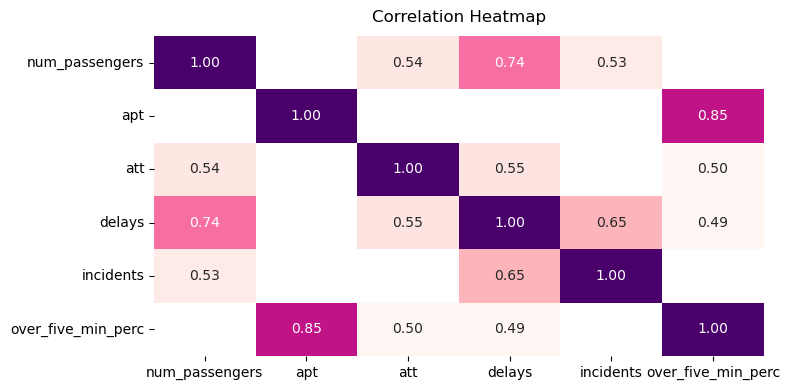

In [60]:
high_corr = corr_mat[abs(corr_mat) >= 0.45]

# Plot correlation heatmap
plt.figure(figsize=(8,4), tight_layout=True)
sns.heatmap(high_corr,
            annot=True,
            fmt='.2f',
            cmap='RdPu',
            vmin=0.5,
            vmax=1, cbar=False)
title = plt.title('Correlation Heatmap', pad = 10)
plt.savefig('incidents2.png')

Let's break down the key correlations from the matrix to identify relationships between different metrics:

## Strongest Correlations
- **APT (Additional Platform Time), ATT (Additional Train Time)** and **Over Five-Minute Wait** :  
   - APT and Over Five-Minute Wait is the strongest correlation **(0.85)**. It suggests that as platform time increases, a higher percentage of passengers fail to complete their journey within 5 minutes. This makes intuitive sense, as delays at the platform directly impact the passengers' overall journey time.
   - The weaker correlation between ATT (Additional Train Time) and Over Five-Minute Percentage **(0.5)** compared to APT (Additional Platform Time) and Over Five-Minute Wait suggests that platform delays have a more immediate and significant effect on passengers' ability to complete their journeys on time.
   - This could imply that reducing platform delays might have a more significant and immediate effect on passenger journey times compared to addressing train delays.

- **Number of Passengers and Delays** (0.74):  
   - A fairly high correlation, indicating that lines with more passengers tend to experience more delays. This could imply that high passenger volumes might lead to operational challenges and crowding, which in turn cause delays.

- **Delays and Incidents** (0.65):
    - This strong correlation highlights that incidents significantly contribute to delays. However, they are not the only factor at play. Passenger volume and other operational factors, such as train schedule adherence, also influence delays.

## Weaker Correlations:
- **APT (Additional Platform Time) and ATT (Additional Train Time)** (0.37):  
   - There is a moderate positive correlation here. While both reflect time-related issues, the relatively lower correlation suggests that platform and train delays don’t always occur together—indicating potential variability in the causes of delays.
- **Incidents and APT** (0.19) or **Incidents and ATT** (0.30):  
   - These relatively low correlations suggest that while incidents cause some delays, they don't significantly influence platform or train times in all cases.

## Key Insights
1. **Platform delays are the most critical for passengers’ journey completion.** Increasing platform time directly leads to more passengers not completing their journey on time. Optimizing platform procedures could have a big impact here.
2. **Passenger volume seems to be a significant driver of delays.** Subway lines with more passengers have more delays, suggesting operational strain. Any measures to reduce crowding (e.g., better schedule adherence or increasing train frequency) might help decrease delays.
3. **Incidents contribute to delays, but not as much as passenger volume or platform time.** Reducing incidents might help with delays, but managing passenger flow and reducing platform times will likely be more effective.


**Shouldn't APT and delays correlate?**

The key reason is that **APT and delays don't always correlate** because of how they are measured. **APT** is an average of how long all passengers wait for their trains. Even if some trains are delayed by more than 5 minutes, others might arrive almost on time, which lowers the overall average wait time (APT). 

On the other hand, **delays** are officially recorded if:
- A train arrives more than 5 minutes late at the final stop.
- A train skips scheduled stops.
- A train is scheduled but doesn’t run.

So, a line might have a high APT — meaning passengers are waiting longer on the platform - without officially recording many delays. 
In simpler terms, on one line, there might be **many small delays** that aren’t officially counted but make people wait longer on the platform. On another line, there could be fewer small delays but **more big delays**, which get counted in the official statistics. This explains why APT and the number of delays don't always align.

# Custom Plotting Functions
Because I will do the same kind of analysis and plotting, I decided to write functions for those plots I will use the most later. 

In [61]:
def plot_1(df, x, y, palette, xtitle, ytitle, figsize=(11, 4)):
    df1 = df.groupby(y)[x].sum().reset_index().sort_values(by=x, ascending=False)
    fig, ax = plt.subplots(1, 2, figsize=figsize, sharey=True, tight_layout=True)
    sns.despine(fig)

    # Plot 1: Number of delays
    sns.barplot(x=x, y=y, data=df1, order=df1[y], palette=palette, ax=ax[0])
    for container in ax[0].containers:
        ax[0].bar_label(container, fontsize=10, fontweight='bold', padding=5)

    # Plot 2: Percentage of delays
    totals = df1[x].sum()
    sns.barplot(x=x, y=y, data=df1, order=df1[y], palette=palette, ax=ax[1])
    for p in ax[1].patches:
        percentage = f'{100 * p.get_width() / totals:.1f}%'
        ax[1].annotate(percentage, (p.get_x() + p.get_width() + 5, p.get_y() + p.get_height() / 2), fontweight='bold')

    ax[0].set(xlabel='', ylabel='', title=xtitle)
    ax[1].set(xlabel='', ylabel='', title=ytitle)

    plt.show()

In [62]:
def plot_month(df, x, y, title, highlight_colour, non_highlight_colour):
    df1 = df.groupby(df[x].dt.month)[y].sum().reset_index()

    df1[x] = pd.Categorical(pd.to_datetime(df1[x], format='%m').dt.strftime('%B'), 
                            categories=['January', 'February', 'March', 'April', 'May', 'June', 'July', 
                                        'August', 'September', 'October', 'November', 'December'], ordered=True)
    df1 = df1.sort_values(x)
    max_cutoff, min_cutoff = df1[y].max(), df1[y].min()
    df1['colours'] = df1[y].apply(lambda val: highlight_colour if val == max_cutoff or val == min_cutoff else non_highlight_colour)

    fig, ax = plt.subplots(figsize=(12, 5), tight_layout=True)
    bars = plt.bar(df1[x], df1[y], color=df1['colours'])
    ax.spines[['right', 'top']].set_visible(False)
    ax.bar_label(bars, padding=5, color='black', fontsize=10, label_type='edge', fmt='{:.0f}', fontweight='bold')
    ax.set_title(title, fontsize=14, fontweight='bold', pad=20)

    plt.show()

In [63]:
def plot_mean_vert(df, x, y, color, title, figsize=(12, 5)):
    df1 = df.groupby(x)[y].mean().reset_index().sort_values(by=y, ascending=False)

    # Create the plot
    fig, ax = plt.subplots(figsize=figsize, tight_layout=True)
    sns.barplot(x=x, y=y, data=df1, order=df1[x], color=color, ax=ax).bar_label(
        ax.containers[0], fontsize=10, fontweight='bold', fmt='{:,.2f}', padding=3)

    # Set title and remove extra spines
    ax.set(xlabel='', ylabel='', title=title)
    ax.spines[['right', 'top']].set_visible(False)

    # Format x-ticks
    plt.xticks(rotation=25, ha='right')

    plt.show()

In [64]:
def plot_distribution(df, column_name, title, color, column):
    pio.templates.default = "plotly_white"
    fig = px.box(df, x=column_name, points="all", labels={column_name: column})
    
    fig.update_layout(
        height=400, width=900, showlegend=False,
        title={'text': title, 'y': 0.9, 'x': 0.5, 'xanchor': 'center', 'yanchor': 'top'})
    
    fig.update_traces(marker_color=color, boxmean=True)
    fig.show()

In [65]:
def plot_bars_with_highlights(df_pivot, normal_colors, title, threshold=1500, ncol=6, hatch='//', borderaxespad=-4.5):
    fig, ax = plt.subplots(figsize=(12, 6))
    x_pos = np.arange(len(df_pivot.index))
    
    added_labels = []
    legend_handles = []

    # Plot each row of the pivot table
    for idx, (line, row) in enumerate(df_pivot.iterrows()):
        bottom = 0
        top_categories = row.sort_values(ascending=False)[:3]
        max_value = row.max()
        max_category = row.idxmax()
        for category, value in top_categories.items():
            color = normal_colors[list(df_pivot.columns).index(category)]
            
            # Plot the bar, highlight the maximum value with hatch and edge
            if category == max_category:
                ax.bar(x_pos[idx], value, width=0.8, bottom=bottom, color=color, hatch=hatch, 
                       edgecolor='blue', linewidth=2, label=category if category not in added_labels else "")
            else:
                ax.bar(x_pos[idx], value, width=0.8, bottom=bottom, color=color, alpha=0.5, 
                       edgecolor=None, linewidth=0.5, label=category if category not in added_labels else "")
            
            # Add category to the legend if it hasn't been added
            if category not in added_labels:
                added_labels.append(category)
                legend_handles.append(mpatches.Patch(color=color, label=category))
            bottom += value

    for container in ax.containers:
        values = container.datavalues
        labels = ['{:.0f}'.format(val) if val > threshold else "" for val in values]
        ax.bar_label(container, labels=labels, label_type='center', fontsize=10, fontweight='bold', color='black')

    plt.title(title, fontsize=14)
    ax.spines[['right', 'top']].set_visible(False)
      
    # Add the legend using the previously collected handles
    plt.legend(handles=legend_handles, loc='lower center', ncol=ncol, borderaxespad=borderaxespad)
    ax.set_xticks(x_pos)  
    ax.set_xticklabels(df_pivot.index)
    ax.set(xlabel='', ylabel='')
    ax.set_xlim([x_pos[0] - 0.6, x_pos[-1] + 0.6])

    plt.tight_layout()
    plt.show()

In [66]:
def plot_monthly_bars_with_highlights(df_pivot, normal_colors, title, threshold=1000, ncol=6, hatch='//', borderaxespad=-4.5):
    df_pivot.index = df_pivot.index.strftime('%B')
    fig, ax = plt.subplots(figsize=(12, 6))
    x_pos = np.arange(len(df_pivot.index))
    
    added_labels = []
    legend_handles = []

    # Plot each row of the pivot table
    for idx, (month, row) in enumerate(df_pivot.iterrows()):
        bottom = 0
        max_value = row.max()
        for category, value in row.items():
            color = normal_colors[list(df_pivot.columns).index(category)]
            
            # Plot the bar, highlight the maximum value with hatch and edge
            if value == max_value:
                ax.bar(x_pos[idx], value, width=0.8, bottom=bottom, color=color, hatch=hatch, 
                       edgecolor='blue', linewidth=2, label=category if category not in added_labels else "")
            else:
                ax.bar(x_pos[idx], value, width=0.8, bottom=bottom, color=color, alpha=0.5, 
                       edgecolor=None, linewidth=0.5, label=category if category not in added_labels else "")
            
            # Add category to the legend if it hasn't been added
            if category not in added_labels:
                added_labels.append(category)
                legend_handles.append(mpatches.Patch(color=color, label=category))
            bottom += value

    # Add bar labels
    for container in ax.containers:
        values = container.datavalues
        labels = ['{:.0f}'.format(val) if val > threshold else "" for val in values]
        ax.bar_label(container, labels=labels, label_type='center', fontsize=12, fontweight='bold', color='black')

    plt.title(title, fontsize=14)
    ax.spines[['right', 'top']].set_visible(False)
    
    # Add the legend using the previously collected handles
    plt.legend(handles=legend_handles, loc='lower center', ncol=ncol, borderaxespad=borderaxespad)
    ax.set_xticks(x_pos)  
    ax.set_xticklabels(df_pivot.index)  # Use month names as x-tick labels
    ax.set(xlabel='', ylabel='')
    ax.set_xlim([x_pos[0] - 0.6, x_pos[-1] + 0.6])

    plt.tight_layout()
    plt.show()

In [67]:
def plot_custom_double_barplots(df, x, y1, y2, fmt1='{:.0f}', fmt2='{:.0f}', estimator=np.sum, color1='#b302b3', color2='#720e9e'):
    fig, axes = plt.subplots(2, 1, figsize=(12, 6), tight_layout=True)
    
    # First Plot (y1)
    sns.barplot(ax=axes[0], x=x, y=y1, data=df, estimator=estimator, errorbar=None, color=color1).bar_label(
        axes[0].containers[0], fontsize=10, padding=5, fmt=fmt1)
    axes[0].set_title(f'{y1.capitalize()} per {x.capitalize()}', pad=20, fontweight='bold')
    axes[0].set(xlabel='', ylabel='')
    axes[0].spines[['right', 'top']].set_visible(False)
    axes[0].tick_params(axis='x', rotation=25)
    
    # Second Plot (y2)
    sns.barplot(ax=axes[1], x=x, y=y2, data=df, estimator=estimator, errorbar=None, color=color2).bar_label(
        axes[1].containers[0], fontsize=10, padding=5, fmt=fmt2)
    axes[1].set_title(f'{y2.capitalize()} per {x.capitalize()}', pad=20, fontweight='bold')
    axes[1].set(xlabel='', ylabel='')
    axes[1].spines[['right', 'top']].set_visible(False)
    axes[1].tick_params(axis='x', rotation=25)
    
    plt.show()

# Exploratory Data Analysis (EDA)
The objective of this EDA is to understand the behavior and trends of subway delays, customer journeys, and major incidents over time across different subway lines and categories. 

## Initial Observations

In [68]:
pd.options.display.float_format = '{:.2f}'.format
df.describe()

,month,num_passengers,apt,att,delays,incidents,over_five_min_perc
count,288,288.00,288.00,288.00,288.00,288.00,288.00
mean,2023-06-16 12:00:00,5433090.96,1.24,0.39,1269.33,1.85,0.14
min,2023-01-01 00:00:00,36094.30,0.44,-1.00,0.00,0.00,0.01
25%,2023-03-24 06:00:00,3084525.67,0.98,0.20,746.75,0.00,0.11
50%,2023-06-16 00:00:00,5537496.30,1.22,0.45,1265.50,1.00,0.14
75%,2023-09-08 12:00:00,7488224.03,1.50,0.63,1745.00,3.00,0.19
max,2023-12-01 00:00:00,12192714.90,2.56,1.20,3391.00,10.00,0.26
std,NaN,2915620.72,0.39,0.38,809.79,1.95,0.06


**Observations**:
1. **Passenger Volume (num_passengers)**: Total number of passengers reported each month and on each line.
   - The number of passengers per month ranges from just over 36,000 to more than 12 million. That’s a huge difference, probably influenced by things like holidays, seasons, events, weather, and the length of the lines.
   - The large standard deviation (around 2.9 million) shows that ridership isn’t steady—it fluctuates a lot, which likely impacts the number of delays, wait times and incidents.
     
***

2. **Additional Platform Time (APT) and Additional Train Time (ATT)**:
   - **APT (Average Additional Platform Time)**: is the estimated average extra time that customers spend waiting on the platform for a train, compared with their scheduled wait time. This metric can take any value, positive or negative.
     - On average, passengers wait about 1.24 minutes longer than scheduled on the platform, but in some cases, it’s as short as 0.44 minutes and as long as 2.56 minutes.
     - The standard deviation of 0.39 indicates most months stay near the average wait time, but there are months where performance is noticeably worse.
   - **ATT (Average Additional Train Time)**: is the estimated average extra time that customers spend onboard a train, compared to the time they would have spent onboard a train if trains were running according to schedule. This metric can take any value, positive or negative.
     - The additional time spent on the train itself is lower (0.39 minutes on average but what's interesting is that there are some months with negative values - meaning trains were actually faster than scheduled. The dataset description says it’s possible but I don’t quite understand the reason yet. Maybe those trains were just quicker than expected.
     
    Extra platform wait time seems like a bigger issue than time spent on the train. Waiting at the platform is where customers lose most of their time.
***
3. **Total Additional Platform and Train Times (total_apt, total_att)**:
   - **Total APT**: Across all customers in a month, the combined extra wait time at the platform can reach as high as 22 million minutes, with an average of 7 million minutes.
   - **Total ATT**: combined extra time on the train is lower, with an average of 2.7 million minutes and a maximum of 8.6 million minutes.
   
    The total additional time indicates that platform delays collectively add up to far more wasted time for passengers than delays while onboard the train. 
***
4. **Delays**: Trains are marked as delayed for three reasons:
• Trains that arrive at the destination terminal (i.e., the final stop of a train’s scheduled trip) more than 5 minutes late
• Trains that skipped scheduled stops
• Trains that were scheduled to run but did not operate
   - Delays are pretty common, but there’s a wide range, with some months being much worse than others. The average number of delays is about 1,269 per month, but in the worst months, this number can rise to over 3,300 delays. This shows how volatile the system can be.
***
5. **Incidents**: Major Incidents are unplanned incidents that delay 50 or more trains.
   - There are, on average, about 1.85 major incidents per month, though in some months, that number can go up to 10. These incidents are relatively rare, but they can have a big impact on service. While incidents don’t happen very often, they’re likely responsible for some of the biggest disruptions when they do occur.
***
6. **Over Five-Minute Delays (over_five_mins)**: The estimated total number of customers whose journeys are not completed within 5 minutes of the scheduled time, reported each month and on each line
   - This metric shows how many customers are affected by service disruptions. Each month, around 828,481 passengers are delayed by more than five minutes, but this number varies greatly - from as low as 3,114 to almost 2 million in some months.
***
7. **Percentage of Passengers Delayed Over Five Minutes (over_five_min_perc)**:
   - A pretty significant portion of riders are delayed more than five minutes on any given month. On average, about 14% of passengers are delayed by more than five minutes, and it can be as high as 26%.


## Passengers
By annual ridership, the New York City Subway is the busiest rapid transit system in both the Western Hemisphere and the Western world, as well as the eleventh-busiest rapid transit rail system in the world. Daily ridership has been calculated since 1985; the record, over 6.2 million, was set on October 29, 2015.

Let's look at the numbers for 2023.

### Passengers Distribution
To visualize distribution, I like to use plotly as the plots are interactive.

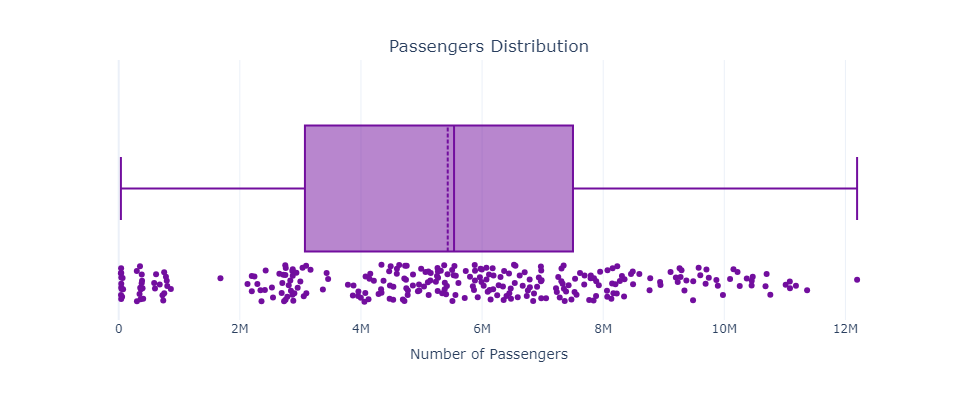

In [69]:
plot_distribution(df, "num_passengers", "Passengers Distribution", '#720e9e', "Number of Passengers")

**Observations**

Ridership is fairly evenly distributed, with a slight skew toward lines/months with fewer passengers. Most lines have a ridership between 3M and 7.5M passengers a month, with half of the lines having fewer than 5.5M passengers.

### Number of passengers by month

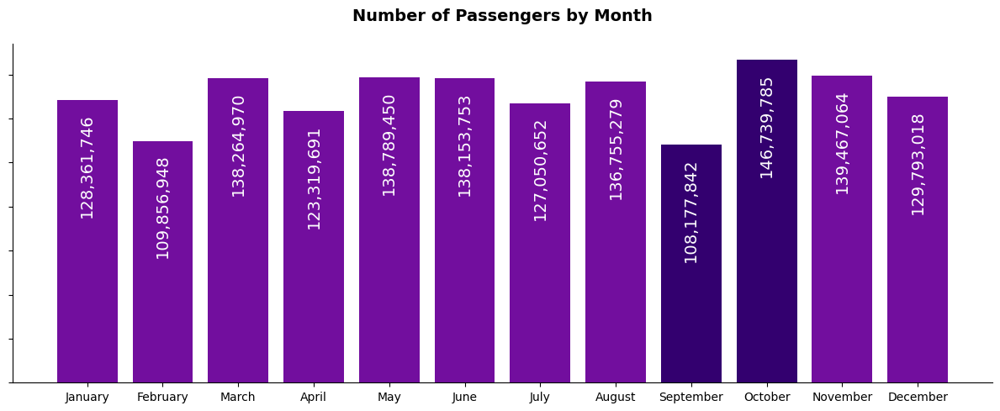

In [70]:
num_passengers = df.groupby('month')['num_passengers'].sum().reset_index()
num_passengers['month'] = pd.to_datetime(num_passengers['month'], format='%m').dt.strftime('%B')
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 
               'September', 'October', 'November', 'December']
num_passengers['month'] = pd.Categorical(num_passengers['month'], categories=month_order, ordered=True)
num_passengers = num_passengers.sort_values('month')

highlight_colour, non_highlight_colour = '#33006F', '#720e9e'
num_passengers['colours'] = num_passengers['num_passengers'].apply(
    lambda x: highlight_colour if x in [num_passengers['num_passengers'].max(), num_passengers['num_passengers'].min()]
    else non_highlight_colour)

fig, ax = plt.subplots(figsize=(12, 5), tight_layout=True)
bars = ax.bar(num_passengers['month'], num_passengers['num_passengers'], color=num_passengers['colours'])

ax.spines[['right', 'top']].set_visible(False)
ax.bar_label(bars, padding=-100, color='white', fontsize=14, label_type='edge', fmt='{:,.0f}', rotation=90)
ax.set_title('Number of Passengers by Month', fontsize=14, fontweight='bold', pad=20)
ax.set_yticklabels([]) 
plt.show()

**Observations**:

The passenger count values for most months are above 120 million, suggesting that the subway system sees consistently high usage throughout the year.

- **October and November have the highest numbers**. 

- **September and February have the lowest numbers** - in September due to the end of the summer tourist season, with many people returning to their regular routines, schools starting back up, and fewer visitors and February most likely due to fewer days. 

It's quite interesting that there was `a noticeable drop in the number of passengers in September and then the ridership rose to its highest in October`. 

## Subway Lines Performance
The New York City subway system consists of different types of lines that serve varying purposes. Here's a breakdown of the key types of subway lines:
1. **Local Lines**  
Definition: These trains *stop at every station* along their route, making them slower than express trains but useful for passengers traveling shorter distances or needing access to less trafficked stations. These lines provide critical access to smaller or local neighborhoods across the five boroughs.

3. **Express Lines**  
Definition: These trains *skip certain stations*, stopping only at key or high-traffic stations to provide faster service over long distances. They are usually paired with local trains on the same line. These express lines are heavily used during rush hours and help commuters travel quickly through major areas like Midtown Manhattan or between boroughs.

4. **Shuttle Lines**  
Definition: These are *short, specialized routes* that often connect two or three key points or provide transfers between major subway lines. They usually operate on a very short track and cover specific areas.

**Examples**:
- The 1, C, G, L, M, R, and W trains are fully local, making all stops.
- The 2, 3, 4, 5, A, B, D, E, N, and Q trains have portions of express and local service.
- The J train normally operates local, but during rush hours it is joined by the Z train in the peak direction. Both run local, express or skip-stop on different parts of their route.
- The 6 and 7 are fully local, but during rush hours, express variants of the routes, designated by diamond-shaped route markers, are operated alongside the locals in the peak direction.
- The F has portions of express and local service, but during rush hours, an express variant of the route, designated by a diamond-shaped route marker, is operated alongside the local in Brooklyn in the peak direction.
- The letter S is used for three shuttle services: the Rockaway Park Shuttle, Franklin Avenue Shuttle, and 42nd Street Shuttle.


### Number of Passengers by Line

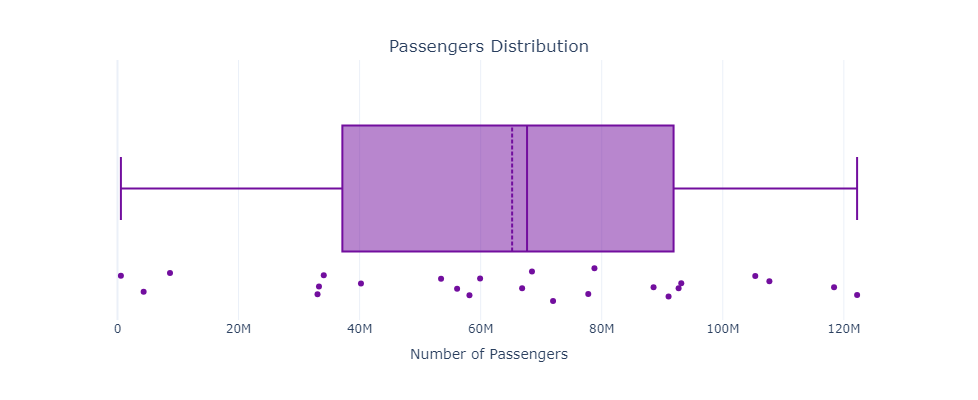

In [71]:
d_line = df.groupby('line')['num_passengers'].sum()
plot_distribution(d_line, "num_passengers", "Passengers Distribution", '#720e9e', "Number of Passengers")

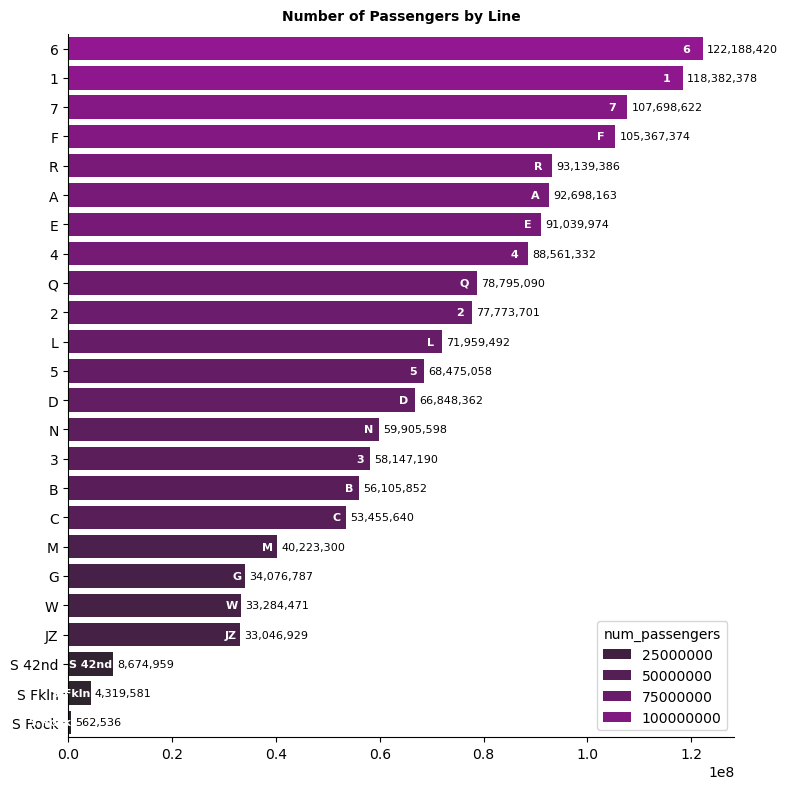

In [72]:
num_passengers = df.groupby('line')['num_passengers'].sum().reset_index().sort_values('num_passengers', ascending=False)

fig, ax = plt.subplots(figsize=(8, 8), tight_layout=True)
sns.barplot(x='num_passengers', y='line', data=num_passengers, order=num_passengers['line'], 
            hue = 'num_passengers', color='#a602a6', ax=ax, errorbar=None)

for i, (value, line) in enumerate(zip(num_passengers['num_passengers'], num_passengers['line'])):
    ax.text(value - (value * 0.02), i, line, color='white', ha='right', va='center', fontsize=8, fontweight='bold')

for container in ax.containers:
    ax.bar_label(container, fontsize=8, padding=3, fmt='{:,.0f}')
    
ax.spines[['right', 'top']].set_visible(False)
ax.set(xlabel='', ylabel='')
ax.set_title('Number of Passengers by Line', pad=10, fontsize=10, fontweight='bold')

plt.show()

**Observations**:

- Lines **`6, 1, 7`, and F have the highest ridership**, each serving over 105 million passengers in 2023, making them the busiest lines in the system.
- Shuttle lines, such as **`S Rock, S Fkln, S 42nd` have the lowest ridership**, with S Rock serving just over 500,000 passengers, reflecting their short routes, limited coverage areas, and specialized purposes.

It's interesting that the second busiest line, `line 1` is a **fully local line** not making any changes in its route even during the rush hours, while most of the other local lines (C, G, L, M, R, W) are closer to the bottom of the plot. That could be because its route runs through densely populated areas without competing express options. In contrast, other fully local lines serve less populated regions, have less direct access to major destinations, or compete with express services.

### Delays and Incidents by Line

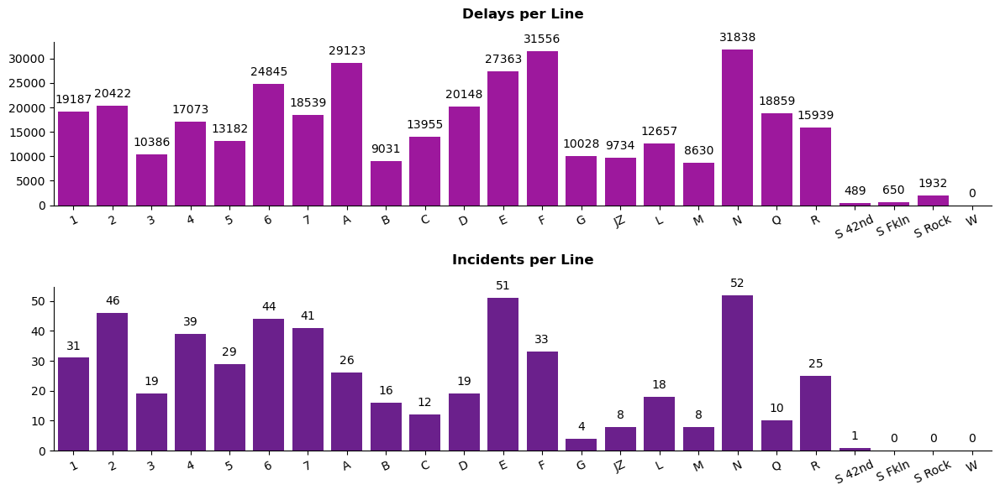

In [73]:
plot_custom_double_barplots(df, x='line', y1='delays', y2='incidents')

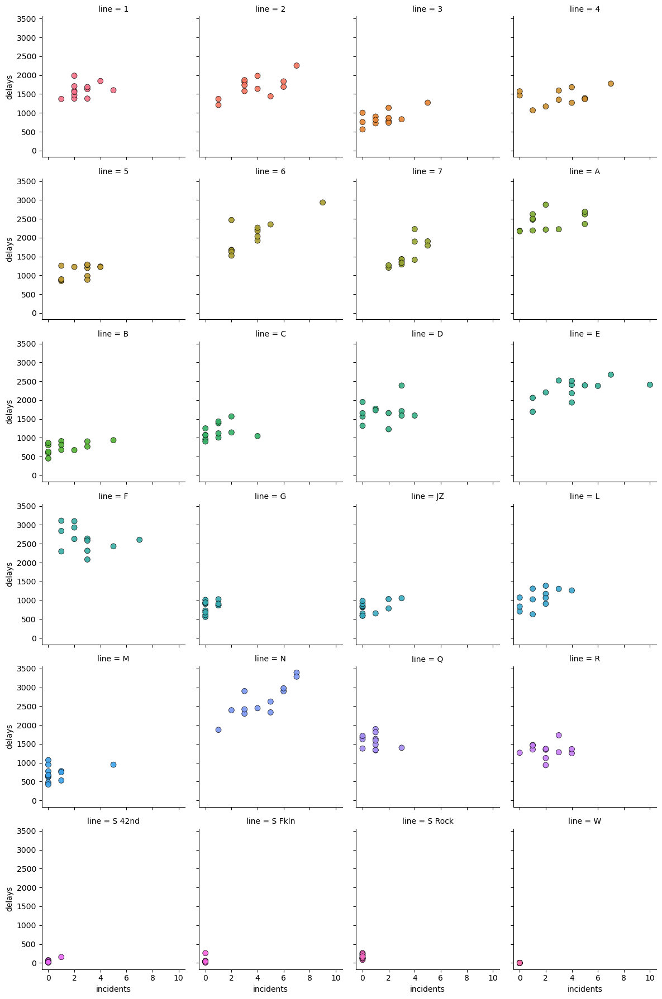

In [74]:
sns.relplot(data=df, kind="scatter", x="incidents", y="delays", 
            hue='line', col="line", height=3, col_wrap=4, s=50, edgecolor='black', alpha = 0.9, legend=False)
plt.show()

**Observations**:

**Lines with High Delays but Lower Incidents:**
- **`N Line`**: **The N line ranks first in both delays (31,838 delays) and incidents (52 incidents), making it the most problematic line in terms of both frequency of delays and major incidents**.
- **`F Line`**: The F line ranks second in delays (31,556 delays) and seventh in incidents (33 incidents). 
- **`A Line`**: The A line ranks third in delays (29,123 delays) but falls to eleventh in incidents (26 incidents). 

While the F and A lines experience a large number of delays, they have relatively fewer incidents, suggesting there’s no direct relationship between the number of delays and major incidents.

**Lines with High Incidents but Lower Delays:**
- **`E Line`**: The E line ranks second in incidents (51 incidents) but ranks fifth in delays (27,363 delays). This indicates that the E line suffers from frequent major incidents despite not being among the worst in terms of delays.
- **`2 Line`**: The 2 line ranks third in incidents (46 incidents) and sixth in delays (20,422 delays), showing that it faces both frequent delays and a significant number of major disruptions.

**"Best-Performing" Lines:**
- Shuttle Lines (**`S Rock, S Fkln, S 42nd`**): These lines consistently rank at the bottom for both delays and incidents likely due to their shorter routes and simpler operations.
- There was no data available for delays and incidents on the W line in the dataset, which means its performance could not be evaluated.

**Conclustion**:
The **N, F, and A lines are the worst performers in terms of delays**, but the **E and 2 lines face significant challenges with incidents**. This highlights that **`delays and incidents do not always correlate perfectly`** — some lines (like the E) suffer from many major incidents despite having fewer delays than the worst performers.

### Normalization of Delays and Incidents
**What if the "best-performing" lines only performed better because they are smaller, less busy lines?**

Subway lines vary significantly in size, length, and the number of passengers they serve, so it might be a good idea to normalize the data to make meaningful comparisons. Maybe simply comparing total delays and incidents wouldn’t be fair because larger lines with more passengers would naturally have more delays and incidents.

To address this, I calculated delays and incidents per 1,000 passengers. It allowed me to normalize the data and compare how efficiently each line operates relative to the number of passengers it serves, rather than just focusing on raw totals.

In [75]:
# make a copy of dataset
df_norm = df.copy()

In [76]:
# Delays per 1,000 Passengers: 
# I divided the total number of delays and incidents for each line by the number of passengers and then multiplied by 1,000.
df_norm['delays (normalized)'] = df_norm['delays'] / df_norm['num_passengers'] * 1000
df_norm['incidents (normalized)'] = df_norm['incidents'] / df_norm['num_passengers'] *1000

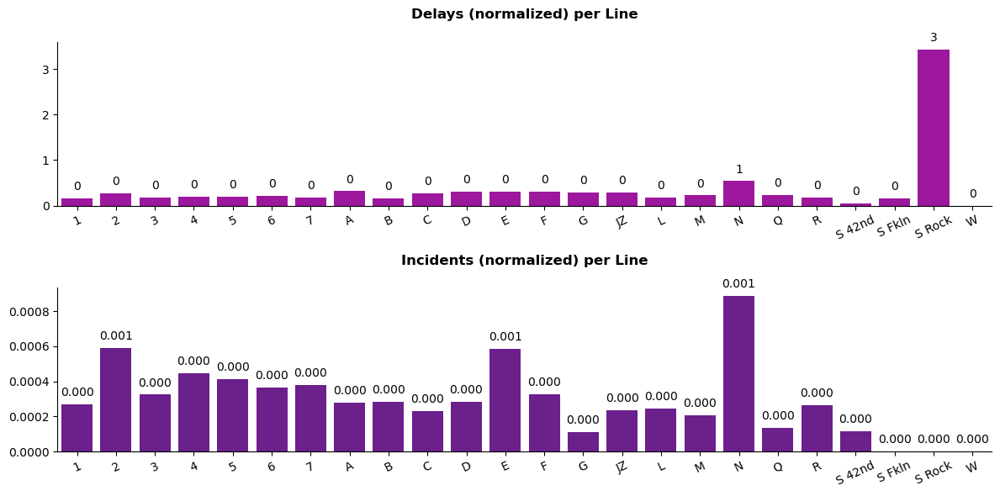

In [77]:
plot_custom_double_barplots(df_norm, x='line', y1='delays (normalized)', y2='incidents (normalized)', fmt2='{:.3f}', estimator=np.mean)

**Observations**:

After normalizing the data by the number of passengers, the picture shifted, and some lines that performed poorly in the raw totals were now seen differently:

**Delay Rates per 1,000 Passengers**:
- The **`S Rock` line had the highest number of delays** per 1,000 passengers (3.43), making it a significant outlier despite its smaller passenger base. In raw numbers, it wasn't among the worst performers, but relative to its passenger volume, it performed poorly.
- The **`N and A` lines still performed poorly** with 0.54 and 0.32 delays per 1,000 passengers, confirming that its issues persist when adjusted for scale.

**Incident Rates per 1,000 Passengers**:
- The **`N, E, and 2` lines had the highest incident rates**, around 0.001 incidents per 1,000 passengers. This is consistent with the pre-normalization analysis, where these lines had the highest number of incidents in absolute terms.

3. **Best-Performing Lines**:
- After normalization, the **`S 42nd` and `S Fkln` lines still performed well**, with very low delays and incidents per 1,000 passengers, though their small scale must be considered when interpreting these results.
- No data was available for the W line, so it could not be evaluated in either analysis.

### Additional Platform Time (APT) by Line

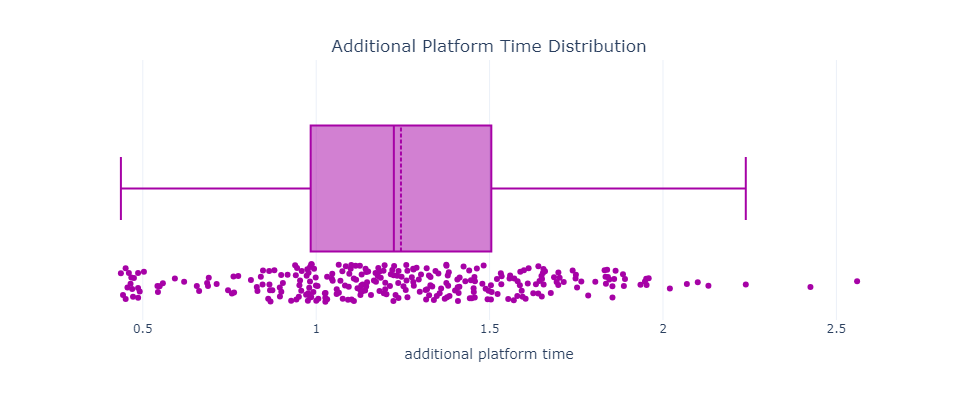

In [78]:
plot_distribution(df, "apt", "Additional Platform Time Distribution", '#a602a6', "additional platform time")

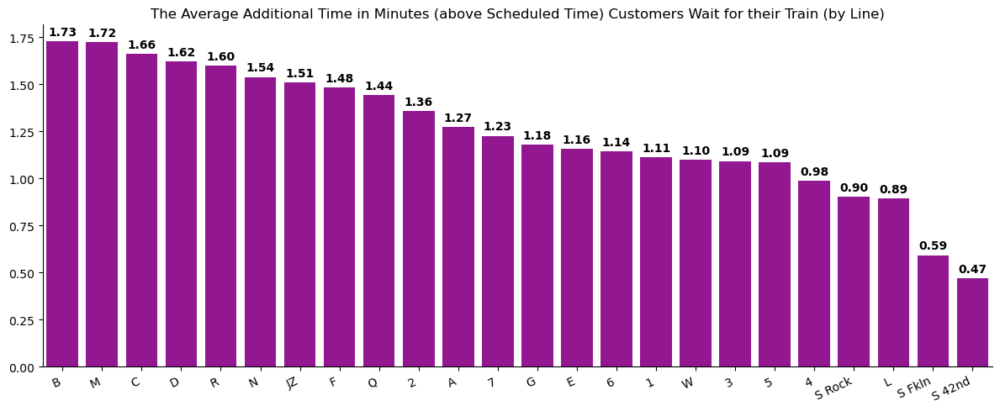

In [79]:
plot_mean_vert(df, 'line', 'apt', '#a602a6', 
           'The Average Additional Time in Minutes (above Scheduled Time) Customers Wait for their Train (by Line)')

**Observations**:
- The **`B and M` lines have the highest average additional wait times**, at 1.73 minutes and 1.72 minutes, respectively. This indicates that customers on these lines experience the longest delays waiting for their trains, relative to the scheduled time.
- Shuttle lines such as **`S 42nd, S Fkln` continue to show strong performance**, aligning with previous analyses of their low delays and incidents. These lines are among the best performers in terms of keeping customers waiting times close to their scheduled times.
- Most of the main subway lines fall between 1.1 and 1.5 minutes in additional wait time, suggesting that the **all lines experience some level of delay beyond the scheduled times**.

### Additional Train Time (ATT) by Line

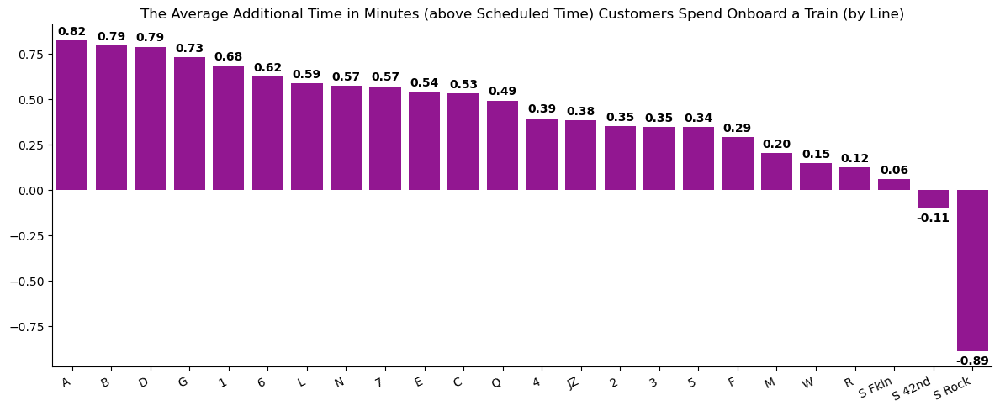

In [81]:
plot_mean_vert(df, 'line', 'att', '#a602a6', 
           'The Average Additional Time in Minutes (above Scheduled Time) Customers Spend Onboard a Train (by Line)')

**Observations**:
- Lines like **`A, B, and D` face significant onboard delays**, with passengers spending longer than scheduled on their trains.
- Shuttle lines, like **`S 42nd` and `S Fkln`**, once again show strong performance with **minimal additional onboard time**, likely due to their shorter routes and operational efficiency.
- The **negative additional time for the `S Rock` line is notable**, as it suggests that passengers are completing their trips faster than expected.

It's quite interesting that the **`S Rock line` has the highest delay rate (3.43 delays per 1,000 passengers), but at the same time, it shows negative Additional Train Time (ATT)**, meaning passengers are spending less time onboard than scheduled. It might be that a shorter route gives it more flexibility in making up for lost time once the train is running.

### Passengers Not Completing Journey Within 5 Minutes of Scheduled Time

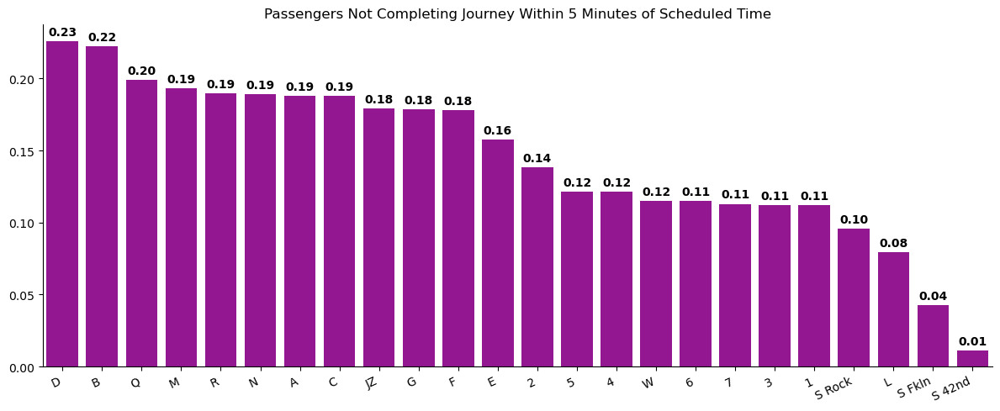

In [82]:
plot_mean_vert(df, 'line', 'over_five_min_perc', '#a602a6', 
           'Passengers Not Completing Journey Within 5 Minutes of Scheduled Time')

**Observations:**

- The **`D, B and Q lines` face the most significant challenges** in ensuring that passengers complete their journeys within the scheduled time. Over 20% of passengers on these lines are impacted by delays.
- Lines such as **`L, S Fkln, and S 42nd` continue to show strong performance**, with minimal delays affecting their passengers.
- **`S Rock`**, despite its high delay rate per 1,000 passengers and unusual ATT behavior, still **manages to keep 90% of passengers completing their journeys on time**.

Contradiction with Previous Metrics:\
The S Rock line stands out here for its relatively low number of delayed journeys, despite having the highest delays per 1,000 passengers and negative ATT (passengers spending less time onboard). This suggests that while delays occur frequently on S Rock, they might be shorter or less severe, allowing most passengers to still complete their journeys on time.

## Delays
Trains are marked as delayed for three reasons:
- Trains that arrive at the destination terminal (i.e., the final stop of a train’s scheduled trip) **more than 5 minutes late**
- Trains that **skipped scheduled stops**
- Trains that were scheduled to run but **did not operate**

In [83]:
overall_sum = df['delays'].sum()
print("Delays total:", overall_sum)

Delays total: 365566


In [84]:
overall_monthly_mean = df.groupby('month')['delays'].sum().mean()
print("Overall monthly mean of delays:", overall_monthly_mean.round(2))

Overall monthly mean of delays: 30463.83


In [85]:
overall_line_mean = df.groupby('line')['delays'].sum().mean()
print("Overall mean of delays by line:", overall_line_mean.round(2))

Overall mean of delays by line: 15231.92


### Delays Distribution

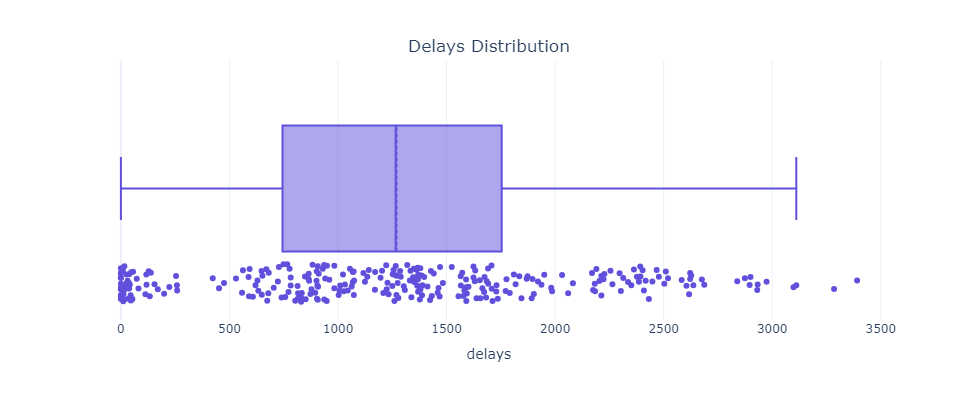

In [86]:
plot_distribution(df, "delays", "Delays Distribution", '#6050DC', "delays")

### Delays by Day Type

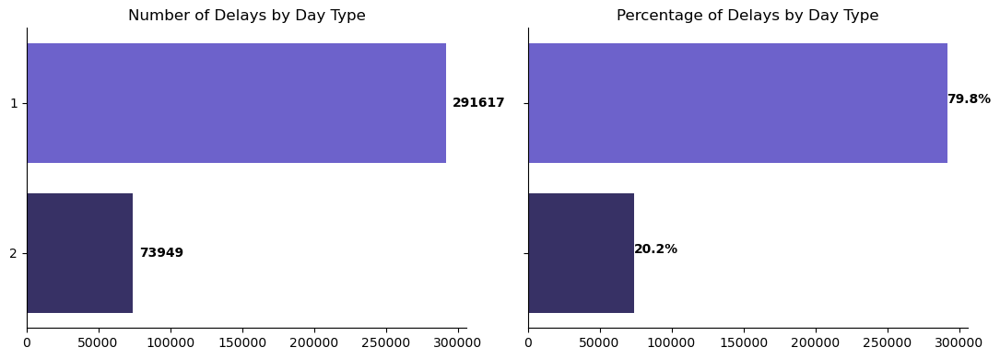

In [87]:
custom_palette = ["#6050DC","#30286E"]
plot_1(delays, 'delays', 'day_type', custom_palette, 'Number of Delays by Day Type', 'Percentage of Delays by Day Type')

**Observations**:

The data shows a clear pattern where the **overwhelming majority of delays happen on weekdays**. This is probably driven by the higher volume of trains and passengers during the workweek.

### Delays by category and type of day

### Delays by Month

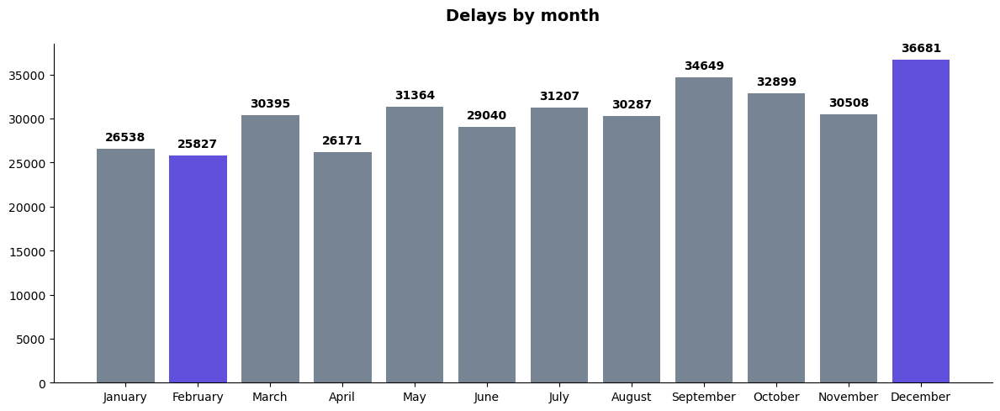

In [88]:
plot_month(delays, 'month', 'delays', 'Delays by month', '#6050DC', '#768493')

**Observations**:

- The dip in **February** could be related to external factors such as fewer workdays, seasonal breaks, or lower activity levels.
- The spike in **December** may be influenced by holiday seasons or end-of-year stress.

### Delays by Category
There are five categories that delays are reported under in this dataset: 
1. Infrastructure & equipment
2. Crew availability
3. Police & medical
4. External Factors
5. Operating conditions
6. Planned ROW work

Every delay is assigned by a dispatcher to a specific incident, for delay analysis purposes. Each incident, in turn, has an assigned cause category and subcategory. Thus, every delay ends up assigned to a specific cause category and subcategory.

**Statistical and Analytic Issues**
The assigning of delays to incidents, and incidents to incident causes, depends upon the *subjective judgement of the dispatcher*. Often, a single subway line can be affected by multiple incidents at the same time, making it difficult to neatly assign a specific delayed train to a single incident. Furthermore, incidents can sometimes have multiple causes, making it difficult to neatly categorize incidents, and the delays assigned to them, by cause. Thus, analysts looking at delay data should look at delay categories as the MTA’s “best guess” of what the delay cause was, nothing more.

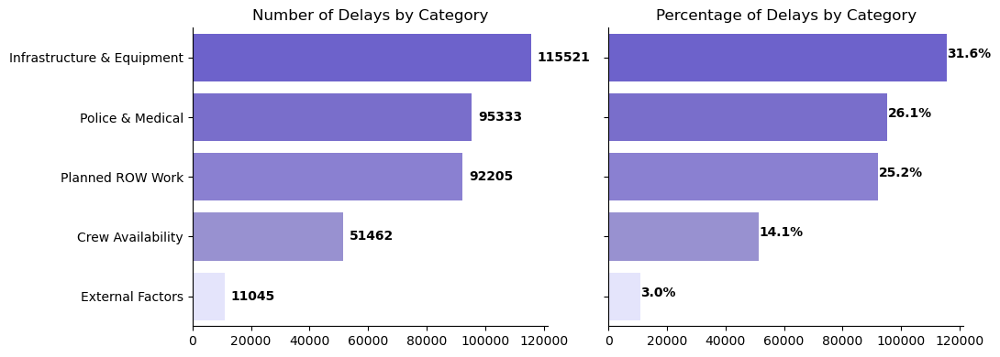

In [89]:
custom_palette = ["#6050DC","#6d5edb", "#8073de", "#9086db", "#e0e0ff"]
plot_1(delays, 'delays', 'category', custom_palette, 'Number of Delays by Category', 'Percentage of Delays by Category')

**The main reasons for delays are:**

- **`Infrastructure & Equipment`** (31.6% of delays, 115,521 incidents): This includes issues like track failures, signal malfunctions, and other equipment breakdowns. It reflects the system's age and the need for regular maintenance. It seems to be a constant source of problems.

- **`Police & Medical`** (26.1% of delays, 95,333 incidents): These delays are caused by incidents involving people, such as crimes, police actions, public behavior, medical emergencies, or individuals on the tracks. This shows how much disruption safety-related incidents can cause and highlights the unpredictability and high number of human-related issues.

**The least common cause:**

- **`External Factors`** are the least common cause, with 11,045 delays (3.0%). These might include weather events, debris on the tracks, and similar issues. The small percentage suggests that these unpredictable events don't happen often.

#### Monthly Trends

In [90]:
# groupby by month, category and subcategory
df_cat_month = delays.groupby(['month','category'])['delays'].sum().reset_index().sort_values('delays')
df_cat_month = df_cat_month[(df_cat_month['delays'] != 0)]

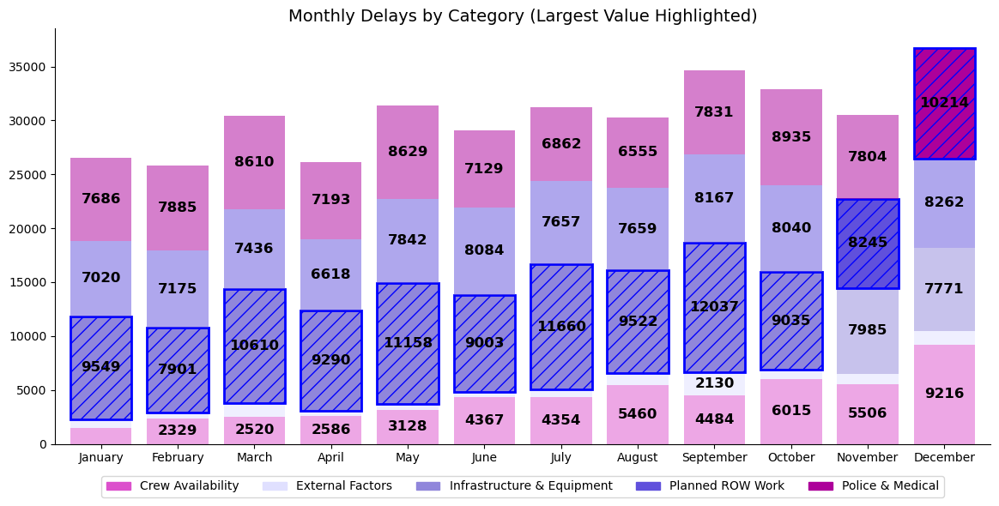

In [91]:
df_pivot = df_cat_month.pivot_table(index='month', columns='category', values='delays', aggfunc='sum').fillna(0)
normal_colors = ["#DC50CC", "#e0e0ff", "#9086db", "#6050DC", "#AD009A"]
plot_monthly_bars_with_highlights(df_pivot, normal_colors, title='Monthly Delays by Category (Largest Value Highlighted)', 
                                  threshold=2000, ncol=6, hatch='//')

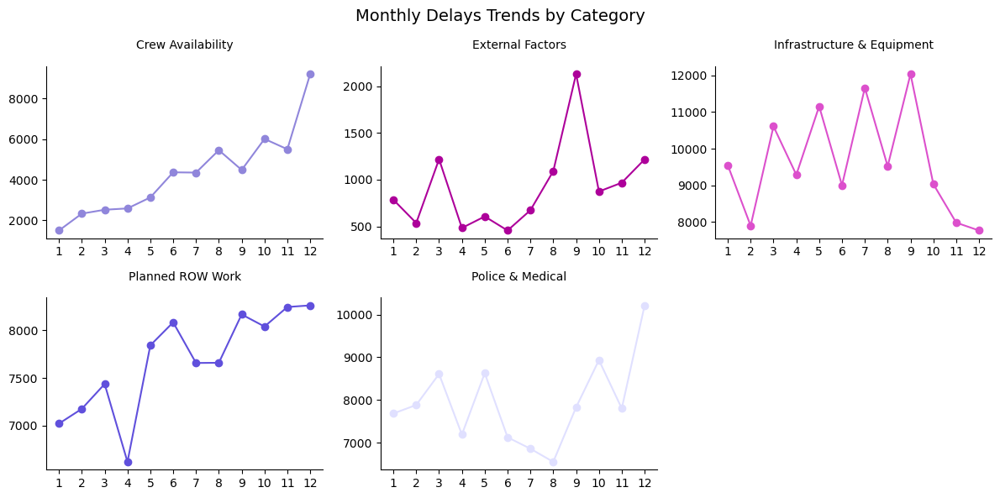

In [92]:
df_cat_month = delays.groupby(['month','category'])['delays'].sum().reset_index().sort_values('month')
categories = df_cat_month['category'].unique()
colors = ["#9086db", "#AD009A", "#DC50CC", "#6050DC", "#e0e0ff"]

fig, axes = plt.subplots(2, 3, figsize=(12, 6), tight_layout=True)
plt.suptitle('Monthly Delays Trends by Category', fontsize=14)
axes = axes.flatten()

for i, category in enumerate(categories):
    category_data = df_cat_month[df_cat_month['category'] == category]
    axes[i].plot(category_data['month'].dt.month, category_data['delays'], color=colors[i], marker='o')
    axes[i].set_title(f'{category}', fontsize = 10, pad = 15)
    axes[i].set_xticks(range(1, 13))
    axes[i].set_xticklabels(range(1, 13))
    axes[i].spines[['right', 'top']].set_visible(False)
    axes[i].set(xlabel='', ylabel='')
fig.delaxes(axes[5])
plt.show()

**Observations**:
1. **`Infrastructure & Equipment` consistently caused the most delays**, indicating that operational and maintenance issues are the main obstacles to system efficiency. Its impact was most felt in September (12037), and it was quite volatile, with **sharp peaks and drops throughout the year**: the highest increase was in **March (+34.3%)** and the highest drop was in **October (-24.9%)**.

2. **`Police & Medical`** delays were also up and down throughout the year, with periods of moderate increases followed by declines in the middle of the year. The big spike in **December (+30.9%)** suggests a rise in emergencies or incidents towards the end of the year, likely influenced by factors such as the holiday season, increased travel, or winter weather conditions.

3. **`Planned ROW (Right of Way) Work`** Surprisingly, this category saw more variation than you'd expect, considering it's scheduled work :-). The most noticeable spike was in **May (+18.5%)**, while the largest drop was observed from March to **April (-11%)**. This shows that while the work was planned, certain months had more intense activity, which led to an uneven distribution of delays. Things seemed to stabilize more in the second half of the year, with fewer fluctuations, suggesting better management and planning during that time.

4. **`Crew Availability`**: The number of delays due to crew availability were changing throughout the year with the **lowest point in January** (1,497 delays) and peaking in **December (+67.4%)**. This might indicate issues with managing staff or resource planning during busier times of the year.

5. **`External Factors`**: External factors were consistently the lowest contributor to delays across all months, with the highest count in September (2,130 delays). This shows that most delays were caused by internal factors rather than uncontrollable external ones. That said, this category had the most extreme fluctuations, making it the most volatile with the largest increase in **March (+127%)** and the largest decrease in **April (-60.3%)**.

**Key issues**:
- **Systemic Infrastructure Issues**: The consistent high delays in the Infrastructure & Equipment category show that there's a need to improve maintenance and operations. Tackling this area could have a big impact on reducing overall delays. The drop in delays towards the end of the year suggests that preventive maintenance or repairs were more effective then, but the earlier volatility  indicates that infrastructure still needs improvement for long-term stability.
- **Emergency Responses (Police & Medical)**: The fluctuations in Police & Medical delays suggest that unexpected incidents, like medical emergencies or law enforcement activity, significantly disrupt service. The spike in December highlights how seasonal factors can increase the likelihood of emergencies. Improving response times and communication for these incidents could help reduce their impact, particularly during peak travel times.
- **Workforce and Crew Management**: The increasing trend in Crew Availability delays in the second half of the year suggests that workforce shortages or scheduling issues  might be causing bottlenecks. Better resource management and workforce planning during high-demand periods could help mitigate these delays.
- **Seasonal Impact on Delays**: Delays tend to spike towards the end of the year across all categories, especially in September and December. This pattern suggests that these months are critical periods where the system is under more strain, possibly due to seasonal factors, operational challenges, or increased demand. Looking into these months in more detail to understand the root causes can help prevent future spikes.

**Priority for Improvement**:

To reduce delays, the main focus should be on improving Infrastructure & Equipment management and addressing Crew Availability issues. Also, better scheduling of planned work and managing emergency responses (Police & Medical) more effectively could help relieve the pressure during critical periods.
By concentrating on these key areas, overall system efficiency and reliability can be improved significantly, especially during the busy times toward the end of the year.

### Delays by Subcategory
These are the subcategories in each category:

| **Category**                   | **Subcategories**                                           |
|---------------------------------|-------------------------------------------------------------|
| **Infrastructure & Equipment**  | - Braking <br> - Door-Related <br> - Fire, Smoke, Debris <br> - Other - CE <br> - Other - Sig <br> - Other Infrastructure <br> - Propulsion <br> - Rail and Roadbed <br> - Service Delivery <br> - Train Brake Activation - Cause Unknown <br> - Other Internal Disruptions <br> - Signal Modernization Capital Project |
| **Crew Availability**           | - Crew Availability                                         |
| **Police & Medical**            | - Persons on Roadbed <br> - Public Conduct, Crime, Police Response <br> - Sick/Injured Customer |
| **External Factors**            | - External Debris on Roadbed <br> - Inclement Weather <br> - External Agency or Utility |
| **Planned ROW Work**            | - Capital Work - Other Planned ROW <br> - Other Planned ROW Work <br> - Subways Maintenance <br> - Work Equipment <br> - Insufficient Supplement Schedule |


In [93]:
# groupby by both category and subcategory
df_cat_subcat = delays.groupby(['category','subcategory'])['delays'].sum().reset_index().sort_values('delays', ascending=False)
df_cat_subcat = df_cat_subcat[(df_cat_subcat['delays'] != 0)]

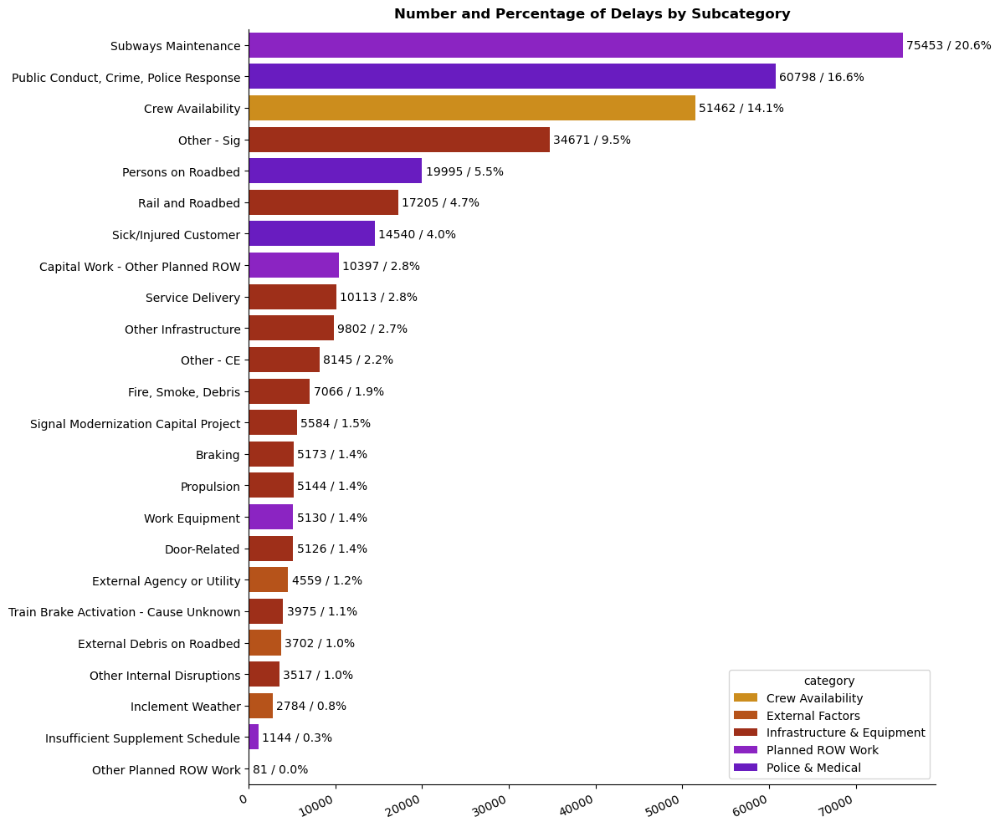

In [94]:
fig, ax = plt.subplots(figsize=(12, 10), tight_layout=True)

sns.barplot(x='delays', y='subcategory', hue='category', data=df_cat_subcat, 
            order=df_cat_subcat['subcategory'], palette='gnuplot_r', ax=ax)
total_delays = df_cat_subcat['delays'].sum()
for container in ax.containers:
    labels = []
    for bar in container:
        value = bar.get_width()
        percent = value / total_delays * 100
        label = f'{int(value)} / {percent:.1f}%'
        labels.append(label)
    ax.bar_label(container, labels=labels, fontsize=10, padding=3)

ax.set(xlabel='', ylabel='')
ax.set_title('Number and Percentage of Delays by Subcategory', fontsize=12, fontweight='bold', pad=10)
ax.spines[['right', 'top']].set_visible(False)
plt.xticks(rotation=25, ha='right')
plt.show()

**Observations**:

`Top Subcategories by Delays:`
1. **Subways Maintenance** (20.6% of total delays, 75,453 delays):
   - This is the largest single subcategory, falling under *Planned ROW Work*. It reflects that ongoing maintenance work on tracks and other infrastructure is a major source of delays, particularly planned maintenance that impacts regular service.
***
2. **Public Conduct, Crime, Police Response** (16.6%, 60,798 delays):
   - This subcategory, under *Police & Medical*, indicates a high number of delays caused by disruptions from passengers, criminal activities, or police interventions. It is a major human-related issue affecting service.
***
3. **Crew Availability** (14.1%, 51,462 delays):
   - The only subcategory under *Crew Availability*, it shows that issues related to staffing—like shortages or scheduling problems—are a major factor causing delays.
***
4. **Other - Sig (Signal-related issues)** (9.5%, 34,671 delays):
   - This is a subcategory of *Infrastructure & Equipment*, pointing to failures in signaling systems as a significant cause of delays. Since the subway system relies heavily on signal functionality for safety and efficiency, these disruptions have a considerable impact.
***
5. **Persons on Roadbed** (5.5%, 19,995 delays):
   - Another significant contributor under *Police & Medical*, unauthorized people on the tracks lead to safety concerns and significant service delays, as trains often have to be stopped or slowed down to avoid accidents.
***
**Insights:**
- **Planned ROW Work** and **Police & Medical** categories/subcategories dominate the top causes of delays, with maintenance and passenger/police-related disruptions being particularly frequent.
- **Crew Availability** is also a significant single factor, emphasizing the importance of having sufficient and well-coordinated staff for train operations.
- **Infrastructure & Equipment** issues, especially signal failures, are responsible for a large portion of delays, highlighting aging or malfunctioning equipment.
- Smaller subcategories are still notable, but their impact is less substantial compared to the larger categories.
  
Overall, this breakdown shows that while human factors (passenger behavior, medical emergencies, staffing issues) play a large role, systemic issues like maintenance, equipment failures, and capital work also contribute heavily to subway delays.

#### Subcategories Percentage and Impact in Categories

In [95]:
df_cat_subcat = delays.groupby(['category','subcategory'])['delays'].sum().reset_index().sort_values('delays')
df_cat_subcat = df_cat_subcat[(df_cat_subcat['delays'] != 0)]

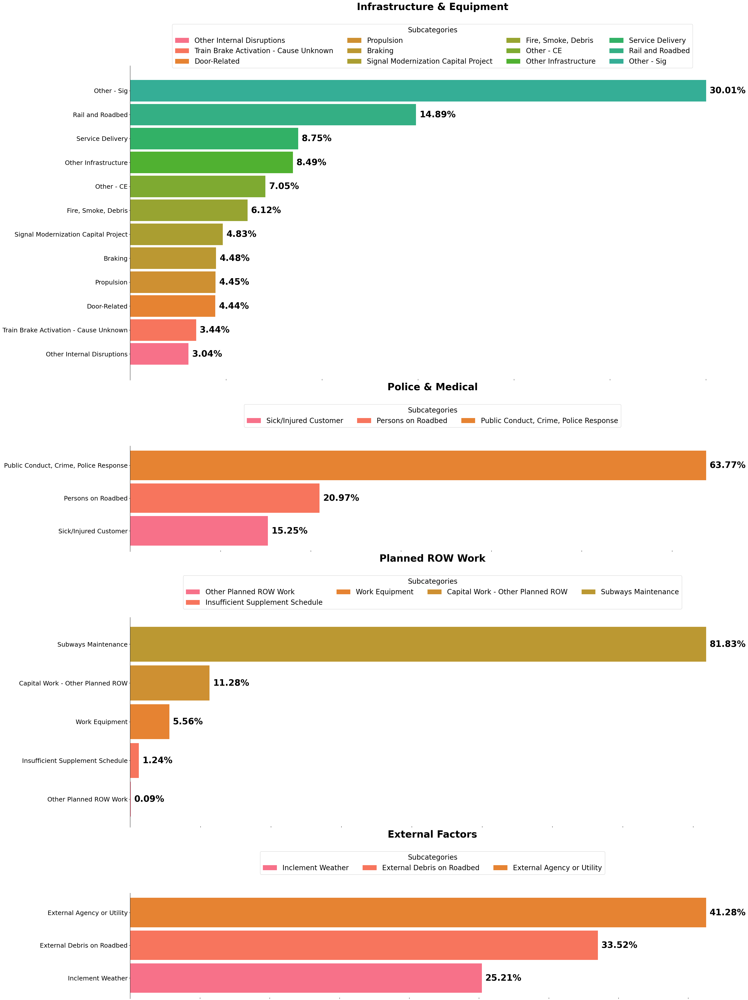

In [96]:
colors = sns.color_palette("husl", len(df_cat_subcat['subcategory'].unique()))
def plot_bar(ax, df, title):
    total_delays = df['delays'].sum()
    percentages = (df['delays'] / total_delays) * 100
    subcategories = df['subcategory']  
    bar_plot = ax.barh(subcategories, percentages, color=colors[:len(subcategories)], height=0.9)
    ax.bar_label(bar_plot, labels=[f'{p:.2f}%' for p in percentages], fontsize=25, fontweight='bold', padding=10)
    ax.set_title(title, fontsize=28, pad=160, fontweight='bold')
    ax.set_yticks(range(len(subcategories)))
    ax.set_yticklabels(subcategories, fontsize=18)
    ax.legend(bar_plot, subcategories, loc='upper center', ncol=4, borderaxespad=-6, fontsize=20,
              title="Subcategories", title_fontsize=20)
    ax.set_xticklabels([])
    sns.despine(fig, bottom=True)

fig = plt.figure(figsize=(30,40), tight_layout=True)
gs = gridspec.GridSpec(4, 2, height_ratios=[3, 1, 2, 1])  
ax1 = fig.add_subplot(gs[0, :]) 
ax2 = fig.add_subplot(gs[1, :]) 
ax3 = fig.add_subplot(gs[2, :]) 
ax4 = fig.add_subplot(gs[3, :])  

plot_bar(ax1, df_cat_subcat[df_cat_subcat['category'] == 'Infrastructure & Equipment'], 'Infrastructure & Equipment')
plot_bar(ax2, df_cat_subcat[df_cat_subcat['category'] == 'Police & Medical'], 'Police & Medical')
plot_bar(ax3, df_cat_subcat[df_cat_subcat['category'] == 'Planned ROW Work'], 'Planned ROW Work')
plot_bar(ax4, df_cat_subcat[df_cat_subcat['category'] == 'External Factors'], 'External Factors')

plt.show()

**Observations**

- **`Infrastructure & Equipment`**:
**Other - Sig** (Signal-related issues) **(30.01%)** stands out as the largest cause of delays in this category, which likely involves signal malfunctions and outdated signaling equipment. What to do: upgrade the signaling system.
- **`Police & Medical`**:
**Public Conduct, Crime, Police Response** **(63.77%)** is by far the largest subcategory. This suggests that incidents like disorderly conduct, vandalism, and other crimes have a significant impact on delays. What to do: address safety and behavior on the subway.
- **`Planned ROW Work`**:
**Subways Maintenance** dominates this category, making up **81.83%** of the delays. Regular system maintenance is clearly the biggest planned cause of service interruptions.
- **`External Factors`**:
**External Agency or Utility** delays take the largest share at **41.28%**, suggesting that problems from third-party entities (like utilities) often disrupt service.

#### Monthly Trends

In [97]:
# groupby by month, category and subcategory
df_subcat_month = delays.groupby(['month', 'category','subcategory'])['delays'].sum().reset_index().sort_values('delays', 
                                                                                                                ascending=False)
df_subcat_month = df_subcat_month[(df_subcat_month['delays'] != 0)]

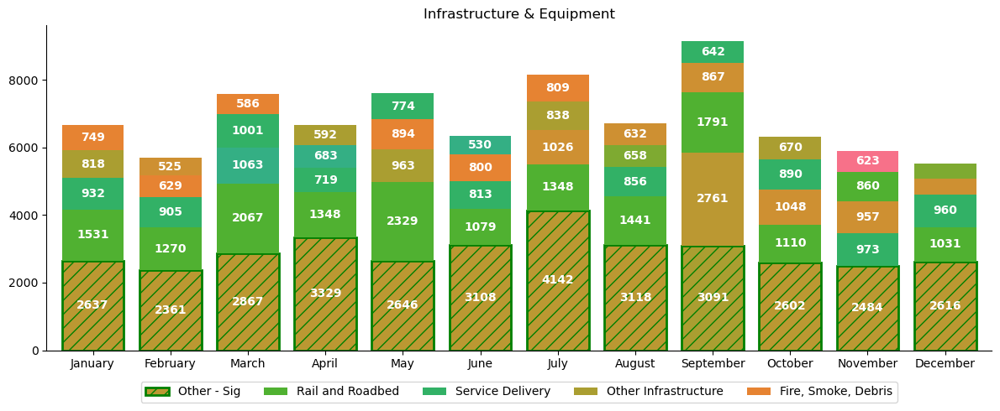

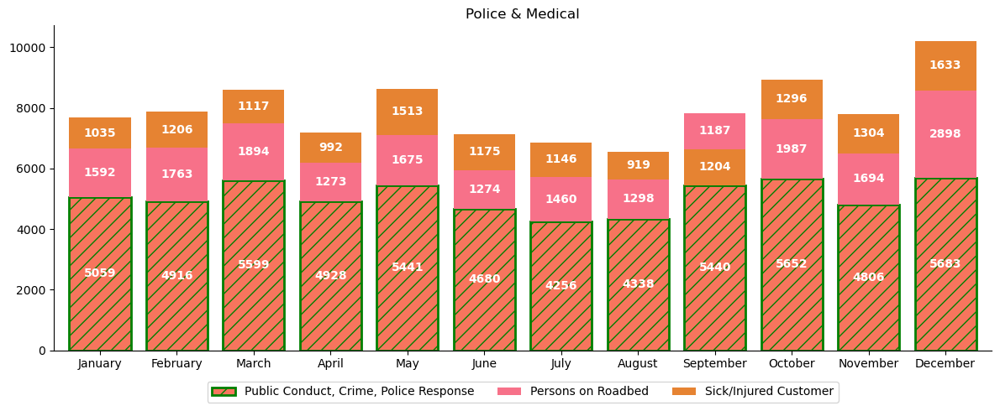

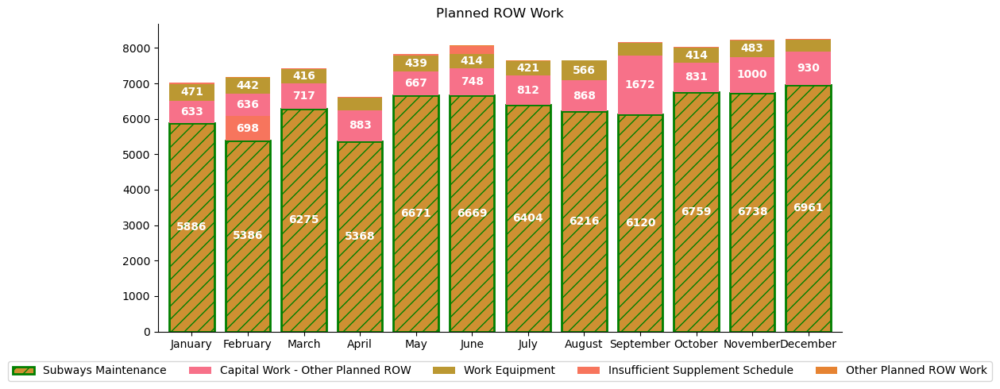

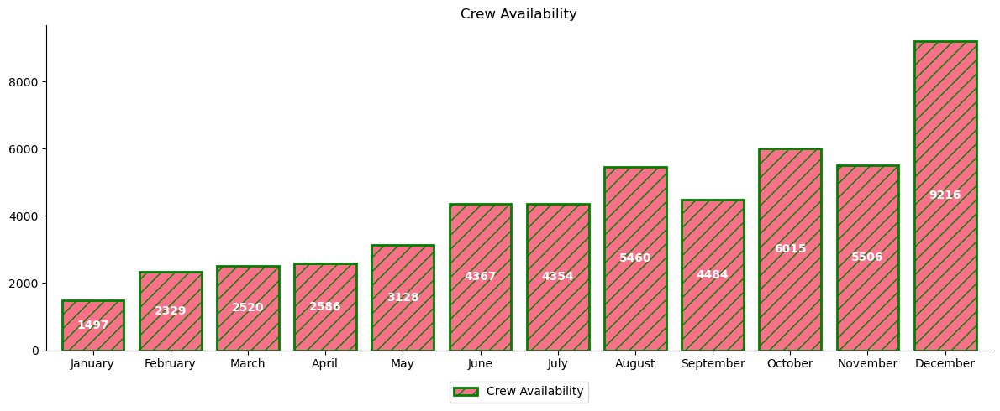

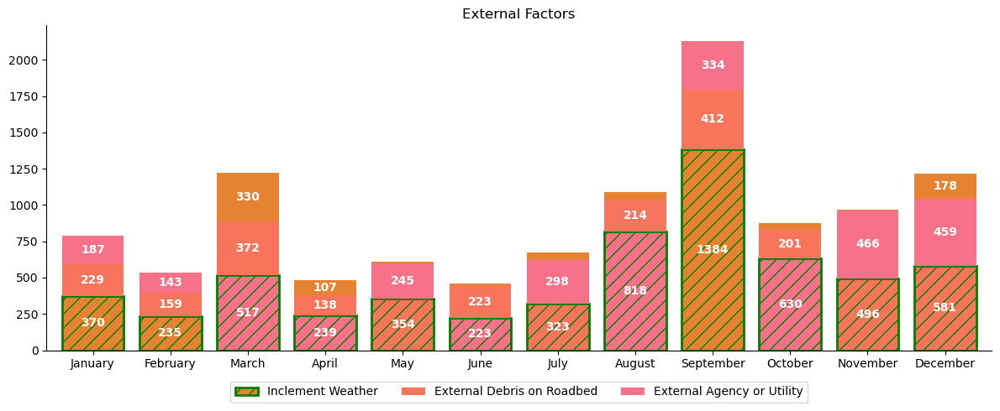

In [98]:
def plot_monthly_delays(df, subcategory, threshold=400):
    normal_colors = sns.color_palette("husl", len(df_subcat_month['subcategory'].unique()))
    df_pivot_r = df.pivot_table(index='month', columns='subcategory', values='delays', aggfunc='sum')
    df_pivot_r.index = df_pivot_r.index.strftime('%B')
    df_pivot_r = df_pivot_r.loc[:, (df_pivot_r != 0).any()]
    
    fig, ax = plt.subplots(figsize=(12, 5))
    x_pos = np.arange(len(df_pivot_r.index))
    
    for idx, (line, row) in enumerate(df_pivot_r.iterrows()):
        bottom = 0
        top_categories = row.sort_values(ascending=False)[:5]
        max_value = row.max()
        max_category = row.idxmax()
        for category, value in top_categories.items():
            color=normal_colors[list(df_pivot_r.columns).index(category)]
            if category == max_category:
                ax.bar(x_pos[idx], value, width=0.8, bottom=bottom, color=color, hatch='//', edgecolor='green', 
                       linewidth=2, label=category if idx == 0 else "")
            else:
                ax.bar(x_pos[idx], value, width=0.8, bottom=bottom, color=color, 
                       edgecolor=None, linewidth=0.5, label=category if idx == 0 else "")
            bottom += value
         
    for container in ax.containers:
        values = container.datavalues
        labels = ['{:.0f}'.format(val) if val > threshold else "" for val in values]
        ax.bar_label(container, labels=labels, label_type='center', fontsize=10, fontweight='bold', color = 'white')

    ax.spines[['right', 'top']].set_visible(False)
    ax.set(xlabel='', ylabel='', title = subcategory)
    plt.legend(loc='lower center', ncol=5, borderaxespad = -4.5)
    ax.set_xticks(x_pos)  
    ax.set_xticklabels(df_pivot_r.index)
    ax.set_xlim([x_pos[0] - 0.6, x_pos[-1] + 0.6])
    plt.tight_layout()
    plt.show()

plot_monthly_delays(df_subcat_month[df_subcat_month['category'] == 'Infrastructure & Equipment'], 'Infrastructure & Equipment', 500)
plot_monthly_delays(df_subcat_month[df_subcat_month['category'] == 'Police & Medical'], 'Police & Medical')
plot_monthly_delays(df_subcat_month[df_subcat_month['category'] == 'Planned ROW Work'], 'Planned ROW Work')
plot_monthly_delays(df_subcat_month[df_subcat_month['category'] == 'Crew Availability'], 'Crew Availability')
plot_monthly_delays(df_subcat_month[df_subcat_month['category'] == 'External Factors'], 'External Factors', 100)

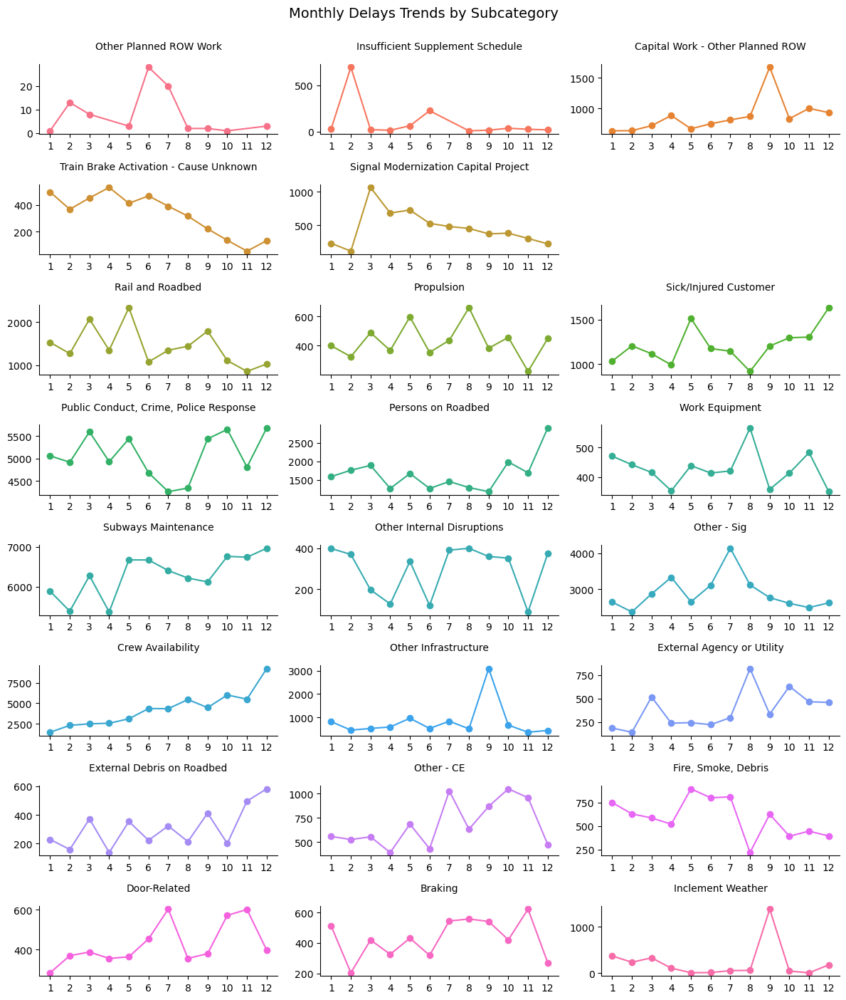

In [99]:
df_subcat_month = delays.groupby(['month', 'category','subcategory'])['delays'].sum().reset_index().sort_values('month')
df_subcat_month = df_subcat_month[(df_subcat_month['delays'] != 0)]
categories = df_subcat_month['subcategory'].unique()
colors = sns.color_palette("husl", len(df_subcat_month['subcategory'].unique()))

fig, axes = plt.subplots(8,3, figsize=(12, 14), tight_layout=True)
plt.suptitle('Monthly Delays Trends by Subcategory', fontsize=14, y=1)
axes = axes.flatten()

for i, category in enumerate(categories):
    category_data = df_subcat_month[df_subcat_month['subcategory'] == category]
    axes[i].plot(category_data['month'].dt.month, category_data['delays'], color=colors[i], marker='o')
    axes[i].set_title(f'{category}', fontsize = 10, pad = 15)
    axes[i].set_xticks(range(1, 13))
    axes[i].set_xticklabels(range(1, 13))
    axes[i].spines[['right', 'top']].set_visible(False)
    axes[i].set(xlabel='', ylabel='')
fig.delaxes(axes[5])
plt.show()

I'll analyze in order of the highest-contributing subcategories all over.

1. **`Subway maintenance`** - **Planned Right-of-Way (ROW) Work**
Subway maintenance is the largest subcategory compared to all others contributing 20.6% of all delays. It was also the biggest subcategory in the Planned ROW Work category throughout the year, with delays ranging from 5,200 to 7,000 per month. The numbers **peak in December with 6,961 delays**. In the second half of the year, there's a consistent increase in delays, hitting the highest points in October, November, and December. Maintenance-related delays stay high throughout the year but dip a bit in the spring, especially in February and April.

    It seems like planned maintenance ramps up toward the end of the year, suggesting that big infrastructure projects are scheduled during this period. The lower delays in spring might be an opportunity to plan work that causes less disruption during the busier months later on.

2. **`Public Conduct, Crime, Police Response`** - **Police & Medical**:
The second largest all over (16.6% of all delays). This subcategory shows steady numbers every month, with the highest **peaks in December (5,683 delays)**, October (5,652), and March (5,599). There's a slight dip in the middle of the year, particularly in July (4,256), but delays generally range between 4,200 and 5,600 throughout the year.

    We see a predictable rise in public conduct-related delays toward the end of the year, especially in December, likely due to increased ridership and more public disturbances during holiday travel. July, on the other hand, has fewer delays, which could be a good time to reallocate resources or make system improvements with minimal disruption. To tackle these delays, steps like boosting police presence, running public awareness campaigns, or making operational adjustments might help.

3. **`Crew Availability`** - **Crew Availability**:
his is the third-largest contributor overall (14.1% of all delays) and the only subcategory in its category. It **peaks sharply in December with 9,216 delays**, followed by October (6,015) and November (5,506). The lowest number of delays happens in January (1,497), with a gradual rise starting in February. This makes early in the year an ideal time for planning, training, or making system adjustments before delays ramp up.

    The steady rise from February to December shows an increasing strain on staff as the year goes on, especially peaking in December. This suggests a need for better workforce management and strategic scheduling during the second half of the year, particularly leading into the holiday season.

4. **`Other - Signals`** - **Infrastructure & Equipment**
The highest number of delays occurs in **July (4,142 delays)**. Delays gradually increase from January (2,637) through July, hitting the highest peak in mid-summer. The lowest number of delays is observed in February (1,786).

    July has the most significant spike, likely due to heat-related issues affecting signaling equipment and increased ridership during the summer. The lower delays at the start of the year provide a chance for preemptive work on signaling systems to prepare for the busy summer period. The decline in delays from September onward suggests that seasonal challenges like heat or higher ridership may ease up, but it's important to keep an eye on signal equipment year-round to maintain stability.

### Delays by Line

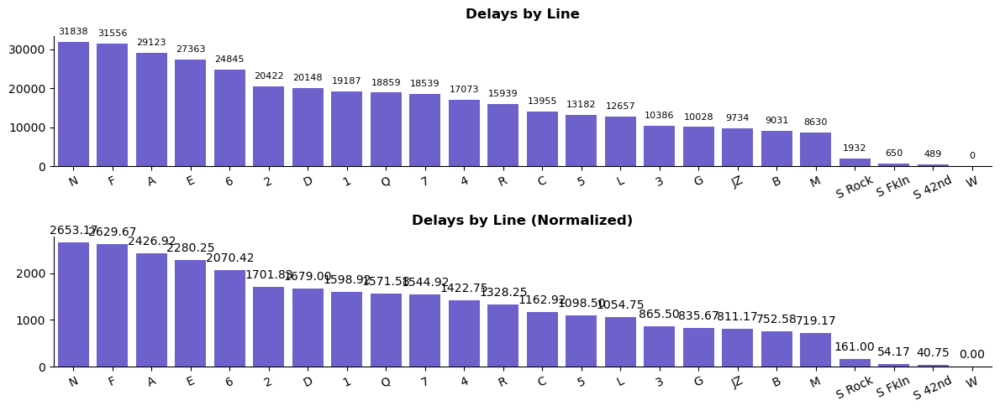

In [100]:
df1 = df.groupby('line')['delays'].sum().reset_index().sort_values(by='delays', ascending=False)
df_norm1 = df_norm.groupby('line')['delays'].mean().reset_index().sort_values(by='delays', ascending=False)

fig, axes = plt.subplots(2, 1, figsize=(12, 5), tight_layout=True)
# Delays per Line 
sns.barplot(ax=axes[0], x='line', y='delays', data=df1, estimator=np.sum, errorbar=None, 
            color="#6050DC", order = df1['line']).bar_label(axes[0].containers[0], fontsize=8, padding=5, fmt='{:.0f}')
axes[0].set_title('Delays by Line', pad=15, fontweight='bold')
axes[0].set(xlabel='', ylabel='')
axes[0].spines[['right', 'top']].set_visible(False)
axes[0].tick_params(axis='x', rotation=25)

# Delays per Line (Normalized)
sns.barplot(ax=axes[1], x='line', y='delays', data=df_norm1, estimator=np.mean, errorbar=None, 
            color="#6050DC", order = df_norm1['line']).bar_label(
    axes[1].containers[0], fontsize=10, padding=5, fmt='{:.2f}')
axes[1].set_title('Delays by Line (Normalized)', pad=10, fontweight='bold')
axes[1].set(xlabel='', ylabel='')
axes[1].spines[['right', 'top']].set_visible(False)
axes[1].tick_params(axis='x', rotation=25) 
plt.show()

This has been covered in the Subway Lines Performance section.

#### Delays by Line and Category

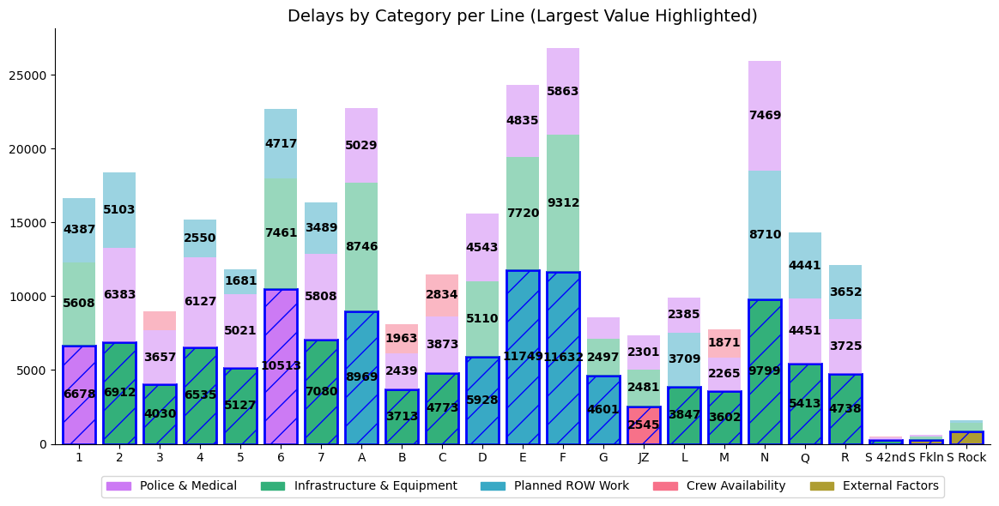

In [101]:
line_cat_delays = delays.groupby(['line', 'category'])['delays'].sum().reset_index().sort_values('delays', 
                                                                                                 ascending = False)
df_pivot = line_cat_delays.pivot_table(index='line', columns='category', values='delays', aggfunc='sum').fillna(0)
normal_colors = sns.color_palette("husl", len(line_cat_delays['category'].unique()))

plot_bars_with_highlights(df_pivot, normal_colors, title='Delays by Category per Line (Largest Value Highlighted)', 
                          threshold=1500, ncol=6, hatch='/')

**Observations**:

**Dominating Cause: Infrastructure & Equipment**
   - **Lines Affected: `2, 3, 4, 5, 7, B, C, L, M, N, Q, R, S 42nd`**
   - Infrastructure and equipment issues are the leading cause of delays on most lines, suggesting a widespread need for maintenance or upgrades. Notably, **`Line N` has the highest delays** in this category (9,799), indicating severe operational challenges.

**Dominating Cause: Planned ROW (Right-of-Way) Work**
   - **Lines Affected: `A, D, E, F, G`**
   - These lines might be undergoing major upgrades or maintenance projects. **`Line E` is the leader (11749 delays)**.
   - **All of the lines heavily affected by Planned ROW Work are from the B Division (lettered lines)**, which serves larger trains and cover longer, more complex routes across multiple boroughs. This concentration of work on lettered lines likely reflects the MTA's focus on modernizing key inter-borough corridors and maintaining the broader infrastructure required for these heavily trafficked routes, ensuring they remain reliable for the growing demand on the system.

**Dominating Cause: Police & Medical**
   - **Lines Affected: `1, 6`**
   - These lines experience the most delays due to Police & Medical incidents, with **`Line 6` standing out for having the highest number of delays (10513)**. This may point to higher safety or emergency-related issues on these routes.

**Dominating Cause: External Factors**
- **Lines Affected: `S Rock, S Fkln`**
- On the S Rock line, External Factors dominate. These could include environmental conditions, third-party incidents, or other factors outside of the control of subway operations.

**Dominating Cause: Crew Availability**
- **Lines Affected: `JZ`**
- On the JZ line, Crew Availability is the main reason for service interruptions, suggesting issues related to staffing levels.

**Summary**:
- **Infrastructure & Equipment** dominates on the majority of lines (13 lines), making it the most common cause of delays overall and suggesting that the subway system is facing significant maintenance or aging infrastructure challenges.
- **Planned ROW Work** affects 5 lines
- **Police & Medical** incidents are a significant issue on 2 lines
- **External Factors** affects 2 lines
- **Crew Availability** affects 1 line

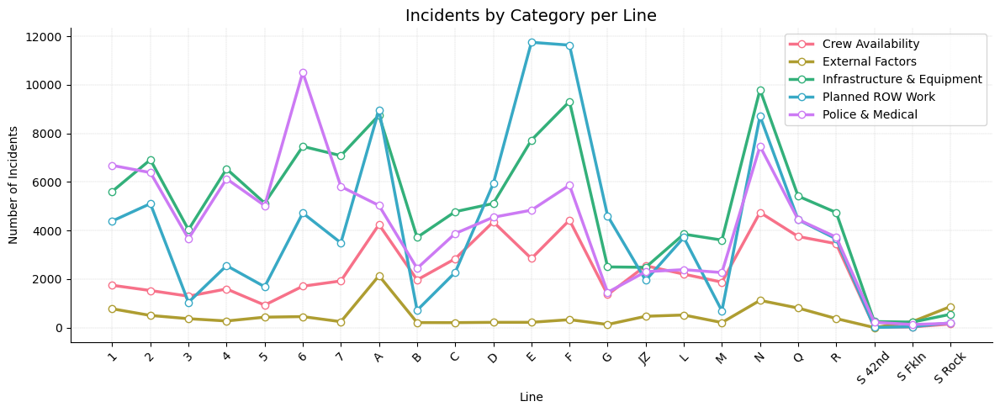

In [102]:
df_pivot = line_cat_delays.pivot_table(index='line', columns='category', values='delays', aggfunc='sum').fillna(0)
normal_colors = sns.color_palette("husl", len(df_pivot.columns))
fig, ax = plt.subplots(figsize=(12, 5))
for idx, category in enumerate(df_pivot.columns):
    ax.plot(df_pivot.index, df_pivot[category], color=normal_colors[idx], label=category,
            linewidth=2.5, marker='o', markersize=6, linestyle='-', markerfacecolor='white')
plt.title('Incidents by Category per Line', fontsize=14)
ax.grid(True, which='both', linestyle='--', linewidth=0.3, alpha=0.7)
ax.spines[['right', 'top']].set_visible(False)
ax.set(xlabel='Line', ylabel='Number of Incidents')
plt.legend(loc='upper right', ncol=1)
ax.set_xticks(np.arange(len(df_pivot.index)))  
ax.set_xticklabels(df_pivot.index, rotation=45)
plt.tight_layout()
plt.show()

**Observations**:

**Dominating Cause: Subways Maintenance**
   - **Lines Affected: `2, A, D, E, F, G, L, N, Q`**
   - Subway maintenance dominates delays on **9 lines**, with the **`F Line`** having the most delays (9303), followed by **`Line E`** (8930 delays), indicating major infrastructure issues across these lines. Maintenance challenges are a significant cause of service disruptions.

**Dominating Cause: Public Conduct, Crime, Police Response**
   - **Lines Affected: `1, 3, 4, 5, 6, 7, S 42nd`**
   - Public conduct and police response are the leading causes of delays on **7 lines**. The most severe impact is seen on **`Line 6`** (7101 delays), indicating significant issues with public disturbances or crime. This highlights the need for enhanced public safety measures and crime prevention strategies, especially on heavily impacted lines.

**Dominating Cause: Crew Availability**
    - **Lines Affected: `B, C, JZ, M, R`**
   - Crew availability is a significant cause of delays on **5 lines**, **`Line R`** has the highest delays from this issue (3454 delays). Staffing shortages or scheduling issues are likely causing significant disruptions on these lines.

**External Agency or Utility** and **Inclement Weather** affect **2 lines** (**`S Rock`** and **`S Fkln`**), pointing to external factors beyond direct subway operations that contribute to delays.

## Incidents
**Major Incidents are unplanned incidents that `delay 50 or more trains`. Such events cause the most disruption to customers.**

In [103]:
overall_sum = df['incidents'].sum()
print("Incidents total:", overall_sum)

Incidents total: 532


In [104]:
overall_monthly_mean = df.groupby('month')['incidents'].sum().mean()
print("Overall monthly mean of incidents:", overall_monthly_mean.round(2))

Overall monthly mean of incidents: 44.33


In [105]:
overall_line_mean = df.groupby('line')['incidents'].sum().mean()
print("Overall mean of incidents by line:", overall_line_mean.round(2))

Overall mean of incidents by line: 22.17


### Incidents Distribution

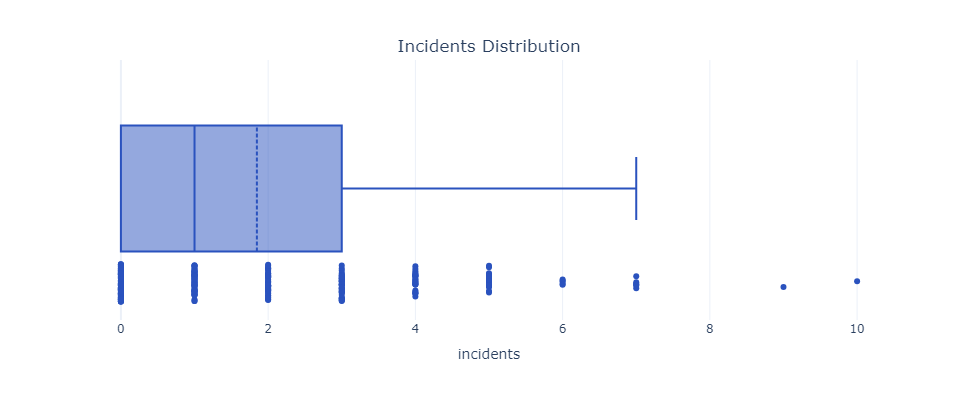

In [106]:
plot_distribution(df, "incidents", "Incidents Distribution", '#2a52be', "incidents")

### Incidents by Day Type
Represents weekday as 1, weekend as 2.

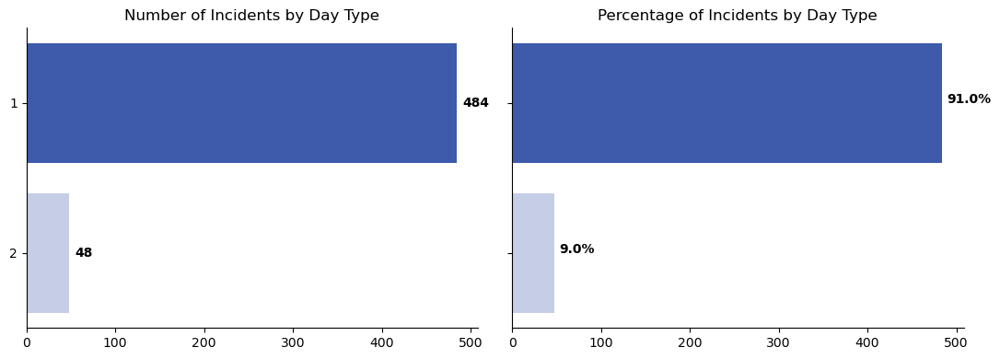

In [107]:
custom_palette = ["#2A52BE","#BFCBEC"]
plot_1(incidents, 'incidents', 'day_type', custom_palette, 'Number of Incidents by Day Type', 'Percentage of Incidents by Day Type')

**Observations**:

The data shows a clear pattern where the **overwhelming majority of incidents happen on weekdays**. This is probably driven by the higher volume of trains and passengers during the workweek. 

So, the resources for handling incidents may need to be more concentrated during these periods (probably with additional focus on rush hours). Conversely, weekends present fewer incidents, which can be used as a potential opportunity to focus on system maintenance or improvement during lower-activity periods.

### Incidents by Month

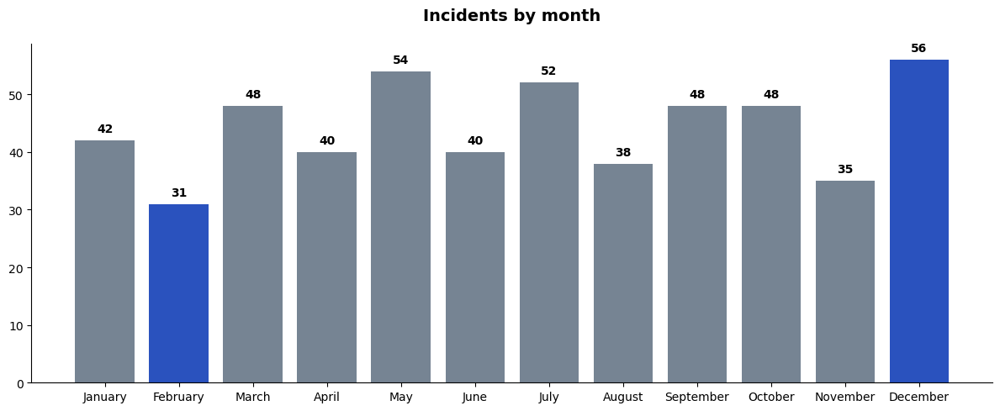

In [108]:
plot_month(incidents, 'month', 'incidents', 'Incidents by month', '#2a52be', '#768493')

**Observations**:

- The **dip in February (31 incidents)** could be related to external factors such as fewer workdays, seasonal breaks, or lower activity levels.
- The **spike in December (56 incidents)** may be influenced by holiday seasons or end-of-year stress.

### Incidents by Category
Major incidents are separated into six categories:
- `Track`: Track fires, broken rails, switch trouble, and other track conditions.
- `Signals`: Signal and track circuit failures, and other equipment and transmission problems related to signals, both for conventional color-light signals and for new technology Communications-Based Train Control (CBTC) signals.
- `Persons on Trackbed/Police/Medical`: Police and/or medical activity due to sick customers, vandalism, assault, persons struck by trains, unauthorized persons on tracks, and suspicious packages.
- `Stations and Structure`: Obstructions and other structural problems, such as damage to tunnels or debris on the right-of-way; electrical problems such as defective wires, cables, and power systems that aren’t on trains, including traction power to run the trains.
- `Subway Car`: Broken doors, seats, windows, lights, brakes, and other problems caused by defective trains, such as power or air conditioning failures.
- `Other`: Inclement weather, water conditions, external power supply failures, as well as drawbridge openings and other external conditions, such as unstable nearby buildings, nearby fires, civil demonstrations, and/or parades.

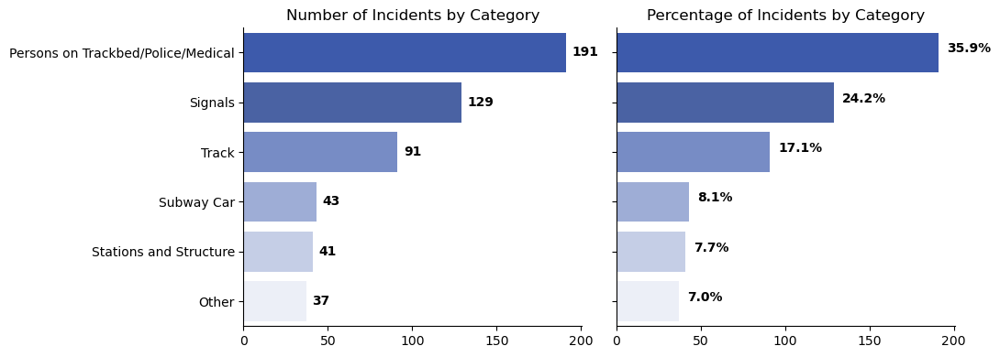

In [109]:
custom_palette = ["#2A52BE","#3B5BB2", "#6A86D2", "#95A9DF", "#BFCBEC", "#EAEEF9"]
plot_1(incidents, 'incidents', 'category', custom_palette, 'Number of Incidents by Category', 'Percentage of Incidents by Category')

**Observations**:

Vast majority of incidents (more than half of all incidents) happen due to 
- **Persons on Trackbed/Police/Medical** (191 / 35.9%): incidents related to police and/or medical activity (sick customers, vandalism, assault, persons struck by trains, unauthorized persons on tracks, and suspicious packages) 
- **Signals** (129 / 24.2%): issues with signals. 

So, **safety and security issues** are by far the largest contributors to subway delays, likely due to their complex and urgent nature. Proactive measures like improved emergency response, station security upgrades, and mental health interventions are crucial for addressing this category. 
Additionally, **signal issues and track maintenance** are key areas where infrastructure upgrades could enhance subway reliability. 

A targeted focus on these two categories could potentially reduce the majority of subway delays and disruptions. **Improving safety protocols and upgrading signal systems should be priorities for optimizing subway operations.**

#### Monthly Trends

In [110]:
# groupby by both category and subcategory
inc_cat_month = incidents.groupby(['month','category'])['incidents'].sum().reset_index().sort_values('incidents')
inc_cat_month = inc_cat_month[(inc_cat_month['incidents'] != 0)]

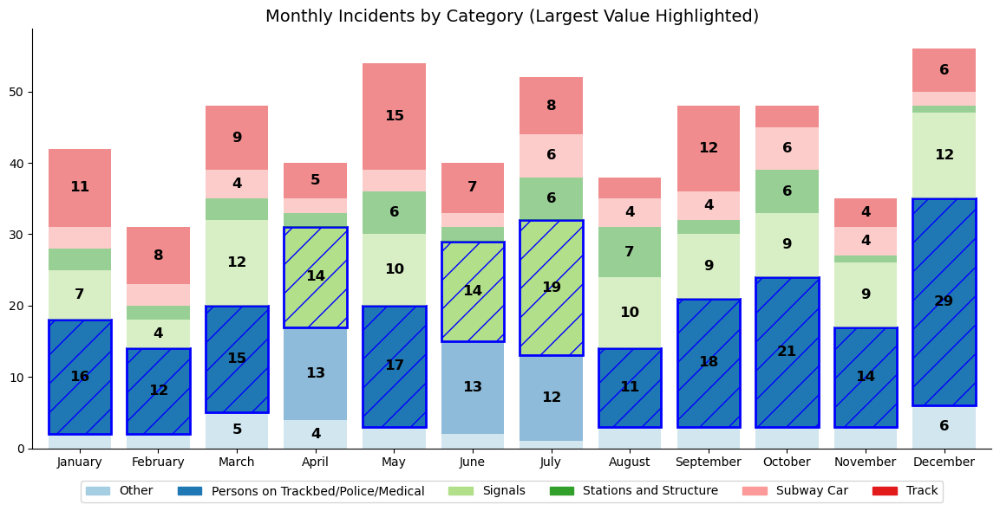

In [111]:
df_pivot = inc_cat_month.pivot_table(index='month', columns='category', values='incidents', aggfunc='sum').fillna(0)
normal_colors = sns.color_palette("Paired", len(inc_cat_month['category'].unique()))
plot_monthly_bars_with_highlights(df_pivot, normal_colors, title='Monthly Incidents by Category (Largest Value Highlighted)', 
                                  threshold=3, ncol=6, hatch='/')

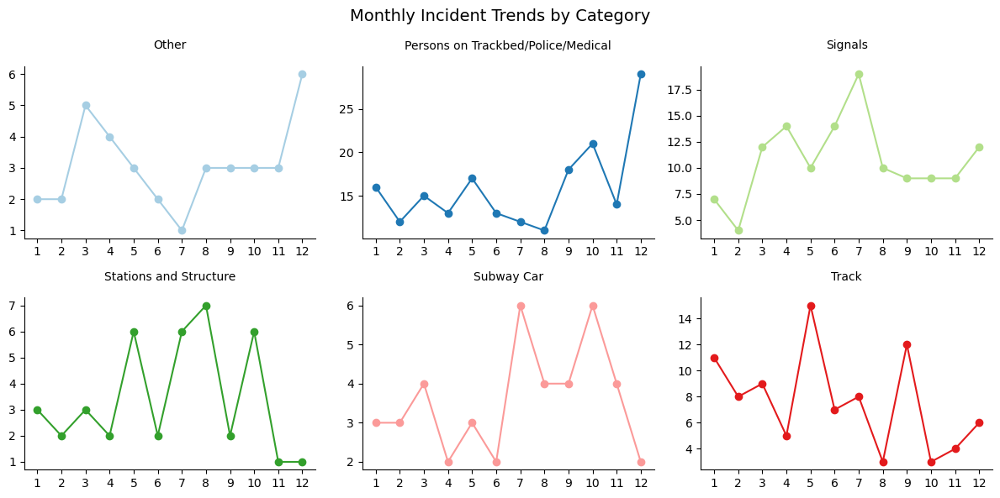

In [112]:
inc_cat_month = incidents.groupby(['month','category'])['incidents'].sum().reset_index().sort_values('month')
categories = inc_cat_month['category'].unique()
colors = sns.color_palette("Paired", len(categories))

fig, axes = plt.subplots(2, 3, figsize=(12, 6), tight_layout=True)
plt.suptitle('Monthly Incident Trends by Category', fontsize=14)
axes = axes.flatten()

for i, category in enumerate(categories):
    category_data = inc_cat_month[inc_cat_month['category'] == category]
    axes[i].plot(category_data['month'].dt.month, category_data['incidents'], color=colors[i], marker='o')
    axes[i].set_title(f'{category}', fontsize = 10, pad = 15)
    axes[i].set_xticks(range(1, 13))
    axes[i].set_xticklabels(range(1, 13))
    axes[i].spines[['right', 'top']].set_visible(False)
    axes[i].set(xlabel='', ylabel='')
plt.savefig('incidents2.png')
plt.show()

**Observations**:

- The **`Persons on Trackbed/Police/Medical`** category stands out with the highest number of incidents throughout the year, especially **spiking in December (29)**. Given that this category involves issues such as unauthorized persons on the tracks, medical emergencies, and police activity, the end-of-year increase could be linked to a rise in incidents due to busier holiday periods or seasonal stress, which may lead to more accidents or emergency situations.

    The continuous high numbers suggest that this is a key area where interventions are most needed, whether through safety campaigns, improved station security, or preventative measures to limit track intrusions.

- **`Signals`** incidents fluctuate more noticeably, with a **peak in July (19)**, hinting at possible seasonal or operational reasons behind the increases.

- Lastly, the **`Other`** category consistently had the lowest numbers, suggesting most issues are captured within the more specific categories.

### Incidents by Line
The subway lines are: 1, 2, 3, 4, 5, 6, 7, A, C, E, B, D, F, M, G, J, Z, L, N, Q, R, W, S 42nd, S Rock, S Fkln.

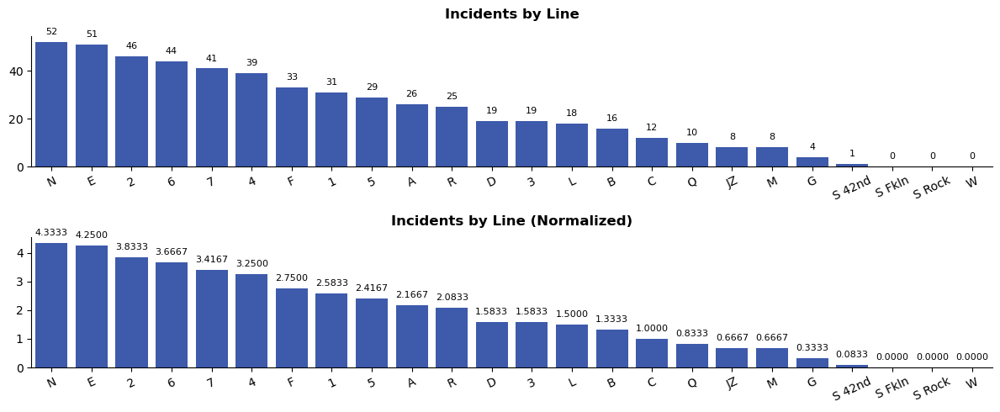

In [113]:
df1 = df.groupby('line')['incidents'].sum().reset_index().sort_values(by='incidents', ascending=False)
df_norm1 = df_norm.groupby('line')['incidents'].mean().reset_index().sort_values(by='incidents', ascending=False)

fig, axes = plt.subplots(2, 1, figsize=(12, 5), tight_layout=True)
# Incidents per Line 
sns.barplot(ax=axes[0], x='line', y='incidents', data=df1, estimator=np.sum, errorbar=None, 
            color="#2A52BE", order = df1['line']).bar_label(axes[0].containers[0], fontsize=8, padding=5, fmt='{:.0f}')
axes[0].set_title('Incidents by Line', pad=15, fontweight='bold')
axes[0].set(xlabel='', ylabel='')
axes[0].spines[['right', 'top']].set_visible(False)
axes[0].tick_params(axis='x', rotation=25)

# Incidents per Line (Normalized)
sns.barplot(ax=axes[1], x='line', y='incidents', data=df_norm1, estimator=np.mean, errorbar=None, 
            color="#2A52BE", order = df_norm1['line']).bar_label(
    axes[1].containers[0], fontsize=8, padding=5, fmt='{:.4f}')
axes[1].set_title('Incidents by Line (Normalized)', pad=10, fontweight='bold')
axes[1].set(xlabel='', ylabel='')
axes[1].spines[['right', 'top']].set_visible(False)
axes[1].tick_params(axis='x', rotation=25) 
plt.show()

This has been covered in the Subway Lines Performance section

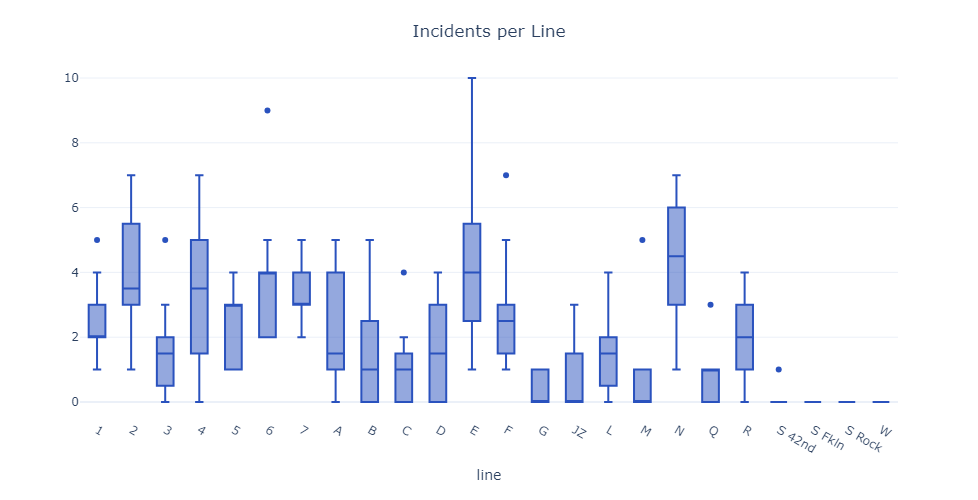

In [114]:
fig = px.box(df, x="line", y = 'incidents')
fig.update_layout(height=500, width=1000, showlegend=False, yaxis_title=None,  
                 title={'text': "Incidents per Line",
                        'y':0.95, 'x':0.5,
                        'xanchor': 'center', 'yanchor': 'top'})
fig.update_traces(marker_color='#2A52BE')
fig.show()

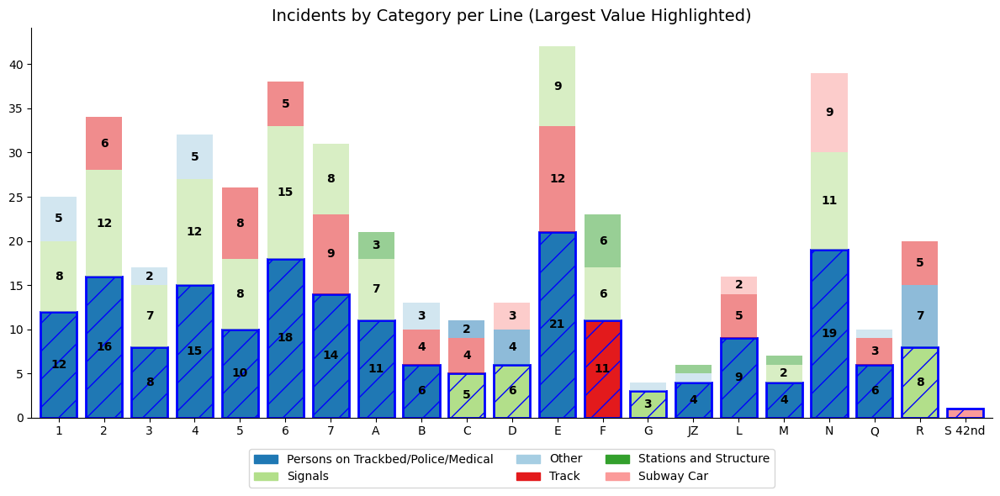

In [115]:
line_cat_incidents = incidents.groupby(['line', 'category'])['incidents'].sum().reset_index().sort_values('incidents', 
                                                                                                          ascending = False)
df_pivot = line_cat_incidents.pivot_table(index='line', columns='category', values='incidents', aggfunc='sum').fillna(0)
normal_colors = sns.color_palette("Paired", len(line_cat_incidents['category'].unique()))
plot_bars_with_highlights(df_pivot, normal_colors, 
                          title='Incidents by Category per Line (Largest Value Highlighted)', borderaxespad=-6,
                          threshold=1, ncol=3, hatch='/')

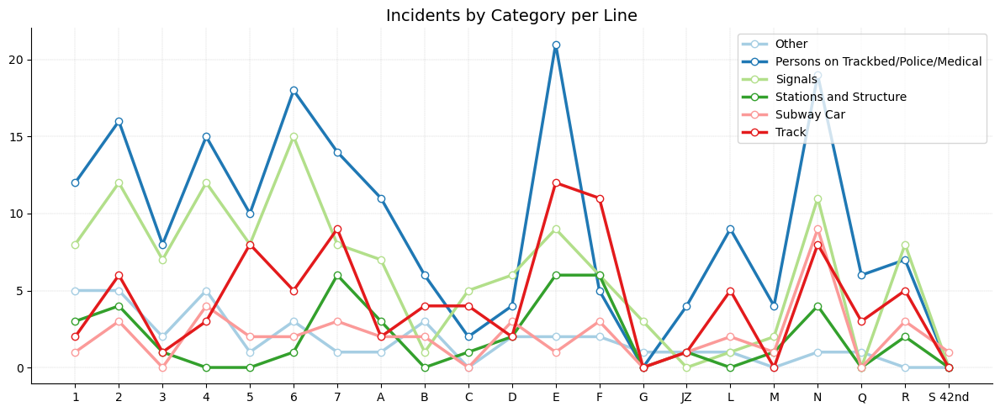

In [116]:
df_pivot = line_cat_incidents.pivot_table(index='line', columns='category', values='incidents', aggfunc='sum').fillna(0)
normal_colors = sns.color_palette("Paired", len(df_pivot.columns))
fig, ax = plt.subplots(figsize=(12, 5))
for idx, category in enumerate(df_pivot.columns):
    ax.plot(df_pivot.index, df_pivot[category], color=normal_colors[idx], label=category,
            linewidth=2.5, marker='o', markersize=6, linestyle='-', markerfacecolor='white')
plt.title('Incidents by Category per Line', fontsize=14)
ax.grid(True, which='both', linestyle='--', linewidth=0.3, alpha=0.7)
ax.spines[['right', 'top']].set_visible(False)
ax.set(xlabel='', ylabel='')
plt.legend(loc='upper right', ncol=1)
ax.set_xticks(np.arange(len(df_pivot.index))) 
plt.tight_layout()
plt.show()

**Observations**:

**Dominating Cause: Persons on Trackbed/Police/Medical**
   - **Lines Affected: `1, 2, 3, 4, 5, 6, 7, A, B, E, JZ, L, M, N, Q`**
   - This is the leading cause of incidents on **15 lines**, with Lines E and N seeing particularly high numbers. These incidents reflect big safety concerns and suggest that boosting public safety measures and policing efforts could help reduce disruptions.

**Dominating Cause: Signals**
   - **Lines Affected: `C, D, G, R`**
   - Signal issues are the main cause of incidents on **4 lines**, especially affecting operations on Lines R and D. This points to a need for improvements in signal systems and infrastructure to cut down delays caused by signal failures.
     
**Dominating Cause: Track**
   - **Lines Affected: `F`**
   - Track-related incidents are the top issue on Line F, causing a big chunk of its service disruptions due to track conditions. This points to maintenance or replacement needs specific to the track on this line.
     
**Dominating Cause: Subway Car**
   - **Lines Affected: `S 42nd`**
   - Subway car issues are the leading cause of incidents on Line S 42nd, highlighting problems with the trains on this shuttle line. Focusing on vehicle maintenance or upgrades might address these issues.

**Summary**:
- **Persons on Trackbed/Police/Medical** is the most common cause of incidents, affecting 15 lines, which suggests there's a widespread issue with safety and policing across the system.
- **Signal issues** affect 4 lines, showing the need for better signal reliability and infrastructure improvements.
- **Track-related incidents** are a big problem on Line F, where track maintenance or improvements are urgently needed.
- **Subway car issues** are the main problem on Line S 42nd, pointing to vehicle-related concerns that may need focused maintenance or upgrades.

# Worst-performing Subway Line
Now I want to compare the performance of different subway lines in terms of delays, major incidents, average platform time, average train time and the number of customers whose journeys were not completed within 5 minutes of the scheduled time.

In [117]:
df_ranks = df.copy()

In [118]:
# let's aggregate by necessary columns
df_ranks = df_ranks.groupby("line").agg(
    num_passengers = ("num_passengers", "sum"),
    apt = ("apt", "mean"),
    att = ("att", "mean"),
    delays = ("delays", "sum"),
    incidents = ("incidents", "sum"),
    over_five_min_perc = ("over_five_min_perc", "mean"),
    ).reset_index()
df_ranks.head()

,line,num_passengers,apt,att,delays,incidents,over_five_min_perc
0,1,118382377.90,1.11,0.68,19187,31,0.11
1,2,77773701.20,1.36,0.35,20422,46,0.14
2,3,58147189.60,1.09,0.35,10386,19,0.11
3,4,88561331.50,0.98,0.39,17073,39,0.12
4,5,68475058.40,1.09,0.34,13182,29,0.12


As previously mentioned, there is no data available for delays and incidents on line W, so let's exclude it from the analysis.

In [119]:
# first, get rid of systemwide values in the division and line columns
df_ranks = df_ranks[df_ranks["line"]!= "W"] 

## Normalization of Delays and Incidents by Passenger Volume
As we saw in the EDA, the number of passengers varies a lot between lines, and it’s important to normalize the data to ensure a fair comparison.

In [120]:
# get delays per passenger
df_ranks['avg_del'] = df_ranks['delays'] / df_ranks['num_passengers']

In [121]:
# get incidents per passenger
df_ranks['avg_inc'] = df_ranks['incidents'] / df_ranks['num_passengers']

In [123]:
# leave only the necessary columns
df_ranks_num_pass = df_ranks[['line', 'num_passengers', 'apt', 'att', 'avg_del', 'avg_inc', 'over_five_min_perc']]

,line,num_passengers,apt,att,avg_del,avg_inc,over_five_min_perc
0,1,118382377.900000,1.111667,0.682812,0.000162,0.000000,0.111873
1,2,77773701.200000,1.358708,0.349335,0.000263,0.000001,0.138418
2,3,58147189.600000,1.091646,0.345778,0.000179,0.000000,0.111999
3,4,88561331.500000,0.984929,0.393394,0.000193,0.000000,0.121358
4,5,68475058.400000,1.085159,0.343400,0.000193,0.000000,0.121544


In [125]:
# Create rankings for each metric
df_ranks_num_pass['rank_passengers'] = df_ranks_num_pass['num_passengers'].rank(ascending=True)
df_ranks_num_pass['rank_delays'] = df_ranks_num_pass['avg_del'].rank(ascending=True)
df_ranks_num_pass['rank_incidents'] = df_ranks_num_pass['avg_inc'].rank(ascending=True)
df_ranks_num_pass['rank_platform_time'] = df_ranks_num_pass['apt'].rank(ascending=True)
df_ranks_num_pass['rank_train_time'] = df_ranks_num_pass['att'].rank(ascending=True)
df_ranks_num_pass['rank_over_five'] = df_ranks_num_pass['over_five_min_perc'].rank(ascending=True)

# Calculate overall rank as the average of all ranks
df_ranks_num_pass['overall_rank'] = df_ranks_num_pass[['rank_delays', 'rank_incidents', 
                                   'rank_platform_time', 'rank_train_time', 'rank_over_five']].mean(axis=1)

## Final Rankings Table

In [126]:
ranks_table_num_pass = df_ranks_num_pass[['line', 'rank_passengers', 'rank_delays', 'rank_incidents', 
                                        'rank_platform_time', 'rank_train_time', 'rank_over_five', 'overall_rank']]

In [127]:
# change the type of column
ranks_table_num_pass = ranks_table_num_pass.astype({"line":'object'}) 
ranks_table_num_pass.sort_values(by='overall_rank', ascending=False).\
                    style.format('{:.1f}', subset=ranks_table_num_pass.select_dtypes(include=['float', 'int']).columns).\
                    highlight_max(color='#6DD2AC').\
                    highlight_min(color='#dadada')
                    #background_gradient(cmap='Blues')

,line,rank_passengers,rank_delays,rank_incidents,rank_platform_time,rank_train_time,rank_over_five,overall_rank
10,D,11.0,20.0,13.0,20.0,21.0,23.0,19.4
17,N,10.0,22.0,23.0,18.0,16.0,18.0,19.4
7,A,18.0,21.0,12.0,13.0,23.0,17.0,17.2
8,B,8.0,3.0,14.0,23.0,22.0,22.0,16.8
11,E,17.0,19.0,21.0,10.0,14.0,12.0,15.2
9,C,7.0,14.0,7.0,21.0,13.0,16.0,14.2
1,2,14.0,15.0,22.0,14.0,9.0,11.0,14.2
12,F,20.0,18.0,15.0,16.0,6.0,13.0,13.6
14,JZ,4.0,17.0,8.0,17.0,10.0,15.0,13.4
18,Q,15.0,13.0,5.0,15.0,12.0,21.0,13.2


## Visualizations

### Bar Plot

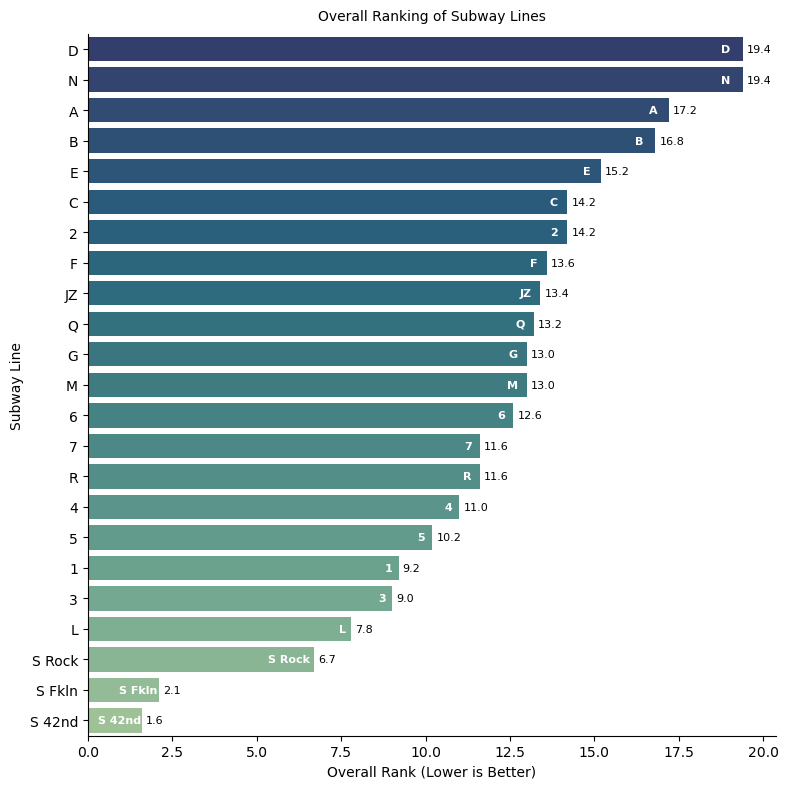

In [128]:
# Sort the data by overall rank
ranks_table_num_pass = ranks_table_num_pass.sort_values('overall_rank', ascending=False)

fig, ax = plt.subplots(figsize=(8, 8), tight_layout=True)
sns.barplot(x='overall_rank', y='line', data=ranks_table_num_pass, palette='crest_r', 
            order=ranks_table_num_pass['line'], errorbar=None, ax=ax)

for i, (value, line) in enumerate(zip(ranks_table_num_pass['overall_rank'], ranks_table_num_pass['line'])):
    ax.text(value - (value * 0.02), i, line, color='white', ha='right', va='center', fontsize=8, fontweight='bold')

for container in ax.containers:
    ax.bar_label(container, fontsize=8, padding=3, fmt='{:.1f}')

# Customize plot appearance
ax.set(xlabel='Overall Rank (Lower is Better)', ylabel='Subway Line')
ax.spines[['right', 'top']].set_visible(False)
ax.set_title('Overall Ranking of Subway Lines', pad=10, fontsize=10)

plt.show()

### Grouped Chart

In [129]:
# create the dataset
r_metrics_num_pass = ranks_table_num_pass[['line', 'rank_passengers', 'rank_delays', 'rank_incidents', 
                                          'rank_platform_time', 'rank_train_time', 'rank_over_five']]
# melt it 
tidy_metrics_num_pass = r_metrics_num_pass.melt(id_vars='line')

,line,variable,value
0,D,rank_passengers,11.000000
1,N,rank_passengers,10.000000
2,A,rank_passengers,18.000000
3,B,rank_passengers,8.000000
4,E,rank_passengers,17.000000


In [130]:
# create dataset of overall ranking
overall_ranking_num_pass = tidy_metrics_num_pass.groupby(['line']).agg({"value": "mean"}).reset_index().sort_values('value', 
                                                                                                                    ascending=False)
# merge it with the melted dataset
tidy_num_pass = pd.merge(tidy_metrics_num_pass, overall_ranking_num_pass, on=["line"])

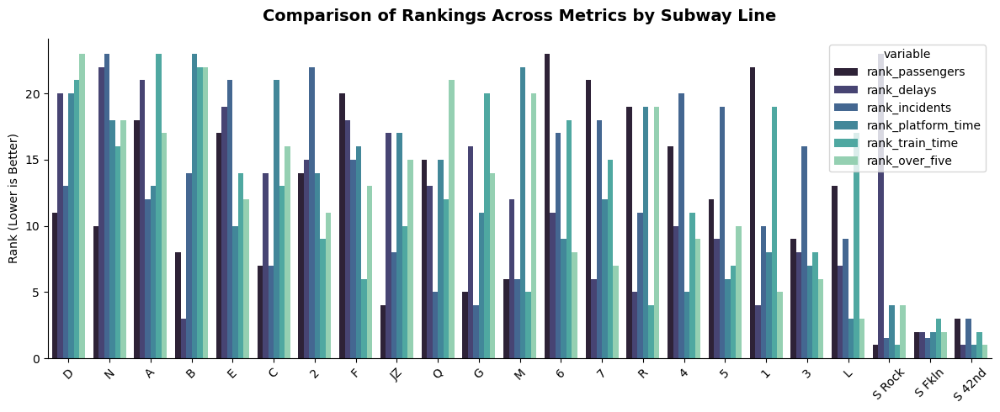

In [131]:
# Plot the grouped data: all ranks for each line
fig, ax = plt.subplots(figsize=(12, 5), tight_layout=True)
sns.barplot(x='line', y='value_x', hue='variable', data=tidy_num_pass, palette='mako', 
            order=tidy_num_pass['line'], ax=ax)

ax.set(xlabel='', ylabel='Rank (Lower is Better)')
ax.spines[['right', 'top']].set_visible(False)
ax.set_title('Comparison of Rankings Across Metrics by Subway Line', fontweight='bold', pad=15, fontsize=14)
plt.xticks(rotation=45)

plt.show()

### Polar Bar Chart

In [132]:
# create a new dataframe by making a copy
data = tidy_metrics_num_pass.copy()

# rename some lines in the line columne to include an underscore
data.replace({'line':{'S 42nd':'S_42nd', 'S Fkln': 'S_Fkln', 'S Rock': 'S_Rock'}}, inplace = True)

In [133]:
# Function to extract datasets for all lines
def extract_all_lines_data(df):
    # Get the unique subway lines
    unique_lines = data['line'].unique()
    
    # Create a dictionary to store the data for each line
    line_data_dict = {}
    
    # Loop over each unique line and extract the corresponding data
    for line in unique_lines:
        line_data_dict[line] = data.loc[data['line'] == line]
    
    return line_data_dict
    
all_lines_data = extract_all_lines_data(data)

# Automate the creation of variables like line_1, line_2, line_A, line_B, etc.
def assign_line_variables(all_lines_data):
    for line in all_lines_data:
        # Dynamically create a variable name like line_1, line_A, etc.
        var_name = "line_" + line
        # Assign the corresponding dataframe to the dynamic variable name
        globals()[var_name] = all_lines_data[line]

assign_line_variables(all_lines_data)
line_1

,line,variable,value
17,1,rank_passengers,22.000000
40,1,rank_delays,4.000000
63,1,rank_incidents,10.000000
86,1,rank_platform_time,8.000000
109,1,rank_train_time,19.000000
132,1,rank_over_five,5.000000


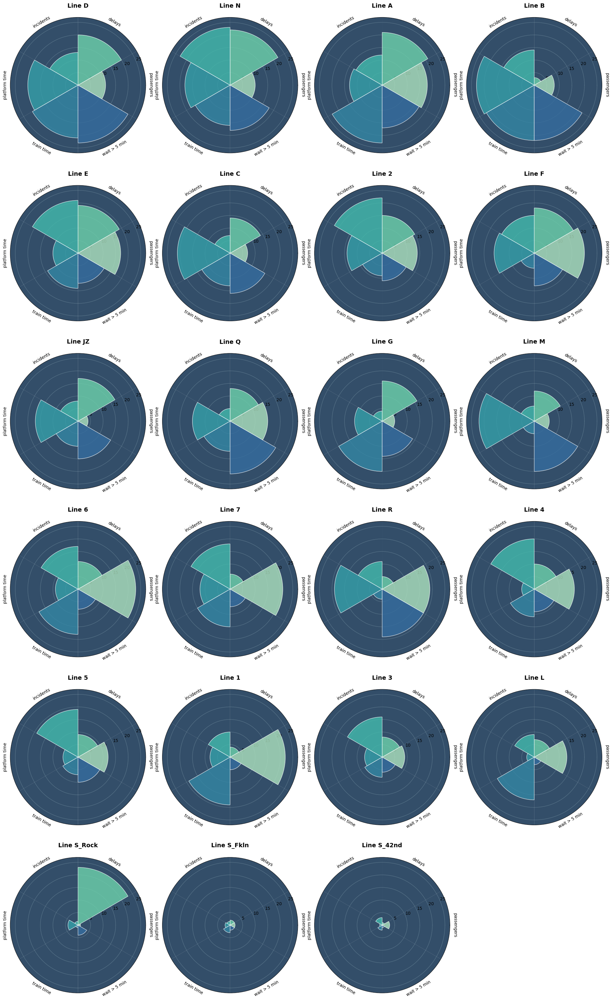

In [134]:
# Function to plot polar bar charts for all lines in a 6x4 grid
def plot_polar_charts_grid(all_lines_data, metrics, metric_names):
    num_lines = len(all_lines_data)
    rows, cols = 6, 4 

    fig, axes = plt.subplots(rows, cols, subplot_kw={'projection': 'polar'}, figsize=(20, 33))
    axes = axes.flatten()
    colors = ["#ADE2BF", "#6DD2AC", "#43BBAD", "#35A0AA", "#3487A5", "#356D9F"]
    #colors = ["#87CEFA", "#0077c0", "#ADD8E6", "#6495ED", "#6699CC", "#0093AF"]
    width = 2 * np.pi / len(metrics)

    # Loop over all lines and plot in grid
    for idx, (line_name, line_data) in enumerate(all_lines_data.items()):
        ax = axes[idx]

        # Get the values for the line
        values = line_data['value']

        # Set up the angles for each metric
        indexes = list(range(len(metrics)))
        angles = [i * width for i in indexes]

        # Background bars
        bars_bg = ax.bar(x=angles, height=27, width=width, color='#002244', zorder=1, alpha=0.8)

        # Main bars representing the values for this line
        bars = ax.bar(x=angles, height=values, width=width, color=colors, edgecolor='white', zorder=2, alpha=0.8)

        # Add metric labels around the chart
        for angle, height, metric_name in zip(angles, values, metric_names):
            rotation_angle = np.degrees(angle)
            if angle < np.pi:
                rotation_angle -= 90
            elif angle == np.pi:
                rotation_angle -= 90
            else:
                rotation_angle += 90
            ax.text(angle, 29, metric_name, ha='center', va='center', rotation=rotation_angle, rotation_mode='anchor', fontsize=10)

        # Remove the circular axis labels
        ax.set_xticks([])

        # Adjust grid and plot limits
        ax.grid(alpha=0.2, color='#E0FFFF', lw=1)
        ax.set_ylim(0, 27)

        # Set title for each plot as the line name
        ax.set_title(f"Line {line_name}", va='bottom', fontweight='bold', pad = 20, fontsize=14)

    # hide any extra subplots that aren't used
    for i in range(num_lines, rows * cols):
        fig.delaxes(axes[i])

    plt.tight_layout()
    plt.show()

# Metrics and their names for display
metrics = ['rank_passengers', 'rank_delays', 'rank_incidents', 'rank_platform_time', 'rank_train_time', 'rank_over_five']
metric_names = ['passengers','delays', 'incidents', 'platform time', 'train time', 'wait > 5 min']

# Plot all the charts in a 6x4 grid
plot_polar_charts_grid(all_lines_data, metrics, metric_names)

## Observations
**Worst Performing Lines (Based on Overall Rank)**
The bottom five lines, according to their overall rank, are:

1. `D Line (Overall Rank: 19.4)`
   - **Strengths**:
       - The D line ranks moderately well in **number of passengers (11th)** and **incidents (13th)**, indicating that it is neither overcrowded nor significantly affected by major disruptions.
   - **Weaknesses**:
       - The D line is *one of the worst* in terms of **delays (20th)**, **average platform time (20th)** and **average train time (21st)**. This could mean that while incidents are somewhat under control, the line struggles with consistent scheduling and travel speed. Long train times and delays might frustrate passengers even if disruptions are relatively rare.
       - It ranks dead last **(23rd) in the percentage of trains arriving more than five minutes late**, indicating it struggles with punctuality. This directly affects the reliability of service and contributes heavily to its poor overall ranking.
   - **Conclusion**:
       - The D line suffers primarily from operational inefficiencies related to timing and train scheduling. Although it’s not dealing with too many disruptive incidents, the **consistency and reliability of the service are severely lacking**.
       - The D Line ranks 11th in terms of passenger volume, and in its current state, **it benefits from having fewer passengers**. This moderate ridership likely keeps its delay-related metrics in better shape, as there is often a strong correlation between high passenger volume and delays. However, this advantage might mask deeper issues in the line’s operations, as it struggles with platform time and train time even with fewer passengers. If the B line were suddenly more popular or overcrowded, its performance would likely deteriorate significantly, exposing these hidden weaknesses.
***
2. `N Line (Overall Rank: 19.4)`
   - **Strengths**:
       - There are no real strengths here. The N line ranks near the bottom in most categories, with **22nd in delays**, **23rd in incidents**, and mediocre rankings in other metrics.
   - **Weaknesses**:
       - The line ranks last **(23rd) in incidents**, suggesting it is particularly prone to disruptions involving 50 and more trains. This kind of unreliability significantly impacts riders.
       - It also performs poorly in terms of **delays (22nd)**, further compounding the issues for passengers who may experience frequent and unpredictable disruptions.
   - **Conclusion**:
       - The N line is **one of the least reliable subway lines**, plagued by both frequent delays and disruptive incidents. This combination makes it a highly stressful line for daily commuters.
       - I believe a similar dynamic applies to the N line as with the D line. The N line ranks 10th in terms of passengers, so it's not serving an overwhelming number of people, but **if its ridership were larger, its overall performance could likely deteriorate further**.
***
3. `A Line (Overall Rank: 17.2)`
   - **Strengths**:
       - It performs somewhat better in the **incident (12th)** and **platform time (13th)** categories, indicating fewer disruptions compared to its peers in the bottom tier.
   - **Weaknesses**:
       - Despite fewer incidents, the A line ranks **last (23rd) for train time**, meaning the trips themselves are lengthy, which suggests either frequent stoppages or slower train speeds.
       - It’s also ranked **21st in delays**, meaning passengers not only experience long rides but also frequent delays, which greatly impacts the overall rider experience.
   - **Conclusion**:
       - The A Line exhibits a consistent mediocrity across most metrics. Although it experiences fewer large-scale incidents, individual trips are long due to frequent stoppages or slower train speeds, leading to a high number of delays. Riders of the A line are more likely to face long, drawn-out trips.
***
4. `B Line (Overall Rank: 16.8)`
   - **Strengths**:
       - The B line stands out positively in **delays (3rd)**. It’s rare for a line to perform this well in delays yet rank so low overall, which makes the B line an interesting case.
   - **Weaknesses**:
       - Despite minimal delays, it ranks last **(23rd) for platform time**, meaning passengers spend a lot of time waiting for trains, which likely offsets the good delay performance.
       - It also ranks **22nd in time people spend on train** and **22nd in trips longer than 5 minutes**, meaning even when you finally board the train, the journey may still be longer than expected. This could be the result of sporadic but extreme disruptions that affect a smaller number of trains disproportionately.
   - **Conclusion**:
       - The B line is an odd case where passengers don’t see as many delays, but are still stuck waiting for longer periods on the platform. Improving the frequency of trains and reducing platform times could substantially boost its ranking.
***
5. `E Line (Overall Rank: 15.2)`
   - **Strengths**:
       - The E line performs somewhat decently in **platform time (10th)** and **over five minutes (12th)**, and **train time (14th)**, which suggests that passengers have longer journeys.
   - **Weaknesses**:
       - It performs very poorly in **incidents (21st)** and **delays (19th)**, so the issue likely lies in the frequent disruptions before and between trips.
   - **Conclusion**:
       - When there are no incidents, the E Line operates quite efficiently, providing passengers with moderate wait times on platforms and timely trips. Frequent incidents and delays significantly affect the overall reliability of the line. This indicates that the line is capable of efficient operations under normal conditions, providing reasonable wait times and timely journeys for passengers. In this sense the E Line and B Line present a contrasting yet insightful comparison.

# Key Insights

1. **Seasonal Variations and Ridership Patterns**
In 2023, the NYC subway served 1.56 billion passengers, with the highest ridership in October (147 million) and the lowest in September (108 million). While there is generally a strong correlation between passenger volume and delays, the peak in ridership did not coincide with the highest delays or incidents, which occurred in December. `This suggests that in this case, factors other than passenger volume - such as weather conditions, holiday disruptions, and operational challenges - played a more significant role in December’s performance issues. The overall increase in delays and incidents toward the end of the year points to cumulative operational stress and seasonal factors affecting service reliability.`

3. **Subway Lines Performance and Efficiency**
The busiest lines - the 6, 1, 7, and F Lines - each served over 105 million passengers. However, high ridership did not necessarily correlate with higher delay rates. For instance, the N Line experienced a high delay rate despite not being among the busiest lines, suggesting that `operational inefficiencies can significantly impact service performance, regardless of passenger volume`.

    Shuttle lines like S 42nd and S Fkln consistently performed well across multiple metrics, thanks to their smaller scale and simpler operations. However, the S Rock Line emerged as an outlier when adjusted for passenger volume, exhibiting the highest delays per 1,000 passengers (3.43). Although not a poor performer in total delays, it became a significant outlier when adjusted for scale. The exact reasons for this high delay rate are unclear based on the available data; further analysis would be required to determine the exact causes. 

4. **Delays and Incidents: Lack of Direct Correlation**
While the N Line had the highest number of delays (31,838) and incidents (52), making it the most problematic, other lines showed a disconnect between these two metrics. For instance, the F Line experienced high delays but not many incidents, suggesting operational challenges rather than major disruptions. Conversely, the E and 2 Lines had a high number of incidents without a corresponding increase in delays, indicating effective incident management or that incidents occurred during off-peak hours.
`This lack of direct correlation suggests that delays and incidents are driven by different factors, and that some lines manage disruptions more efficiently than others`.

5. **Operational Metrics and Passenger Impact**
- Average Platform Time (APT): The B (1.73 min), M (1.72 min), and C Lines (1.66 min) had the highest APT, indicating longer waits on platforms. This suggests issues with train frequency and scheduling. In contrast, shuttle lines like S 42nd and S Fkln had minimal platform delays, reflecting efficient operations.

- Average Train Time (ATT): The A (0.82 min), B (0.79 min), and D Lines (0.79 min) experienced the longest onboard delays, meaning passengers spent more time onboard than scheduled. This could be due to slower train speeds, frequent stops, or operational bottlenecks.

- Journeys Over 5 Minutes Late: Over 20% of passengers on the D, B, and Q Lines faced significant delays, highlighting serious punctuality issues.
  
    `There's no direct correlation between APT and ATT across all lines - high APT does not always coincide with high ATT. The B Line's problems are pervasive, affecting the entire travel experience. This line may require comprehensive operational overhauls, including scheduling optimization and infrastructure improvements.`

5. **Categories of Delays and Their Impact**
- Infrastructure & Equipment: As the largest contributor to delays (31%), issues in this category peaked in September. This points to widespread maintenance challenges and aging infrastructure requiring urgent attention.
- Police & Medical: Accounting for 26.1% of delays, this category peaked in December, likely influenced by the holiday season increasing emergencies and public conduct issues.
- Planned Right of Way (ROW) Work: Representing 25.2% of delays, this category saw a significant spike in November. The planned nature of these delays highlights the need for better management and scheduling. 
    Subcategories like Subways Maintenance and Public Conduct, Crime, Police Response were major contributors to delays, also peaking in December, underscores the necessity for infrastructure investment and enhanced security measures.
  
    `While the overall number of delays peaked in December due to increases across multiple categories, the Infrastructure & Equipment category specifically peaked earlier in September. This suggests that different factors contributed to delays in different months, with December's peak driven by spikes in Police & Medical delays and other categories.`

6. **Worst-Performing Lines**
   
    **`The bottom five lines in 2023 were the D, N, A, B, and E Lines, consistently underperforming across key metrics`**:
- **D Line**: Suffered from severe operational inefficiencies, ranking poorly in delays, APT, ATT, and percentage of journeys lasting more than five minutes. 
- **N Line**: Plagued by frequent delays and the highest number of incidents, making it one of the least reliable lines. 
- **A Line**: Experienced the longest onboard delays and frequent delays despite moderate incident rankings. 
- **B Line**: An outlier with good delay performance but poor APT and ATT rankings, indicating issues with train frequency. 
- **E Line**: Struggled with high incidents and delays.

# Final Recommendations
After analyzing the 2023 NYC subway system data, here are practical steps to improve service reliability and enhance the passenger experience. For each recommendation, we first state the problem identified, then explain what can be done to address it.

1. **Prepare for Seasonal Disruptions**
   - Problem: December experienced the highest delays and incidents, despite not having the peak ridership. Factors like weather conditions, holiday disruptions, and operational challenges significantly contributed to service issues during this month.
   - Recommendations: Prepare for busy periods: focus on reducing delays during high-traffic months by adjusting staff levels and fine-tuning schedules. Better communication: keep passengers informed about possible delays or service changes during seasons with more disruptions.
***
2. **Enhance Operational Efficiency**
   - Problem: Lines such as the D and N have high delay rates despite moderate ridership, indicating underlying operational inefficiencies that impact service regardless of passenger volume.
   - Recommendations: Review operations: conduct checkups on lines with high delays, like the D and N Line. Apply best practices: Take what's working well on high-performing lines and apply those methods to low-performing ones.
***
3. **Improve Incident and Delay Management**
   - Problem: Delays and incidents are influenced by different factors, and some lines handle disruptions less effectively than others.
   - Recommendations: Customize response plans: tweak strategies for specific lines to better manage delays and incidents and reduce the issues. Prevent problems: invest in security and maintenance, infrastructure, planned ROW work to cut down on delays and incidents.
***
4.  **Optimize Schedules and Increase Train Frequency**
       - Problem: High Average Platform Time (APT), high Average Train Time (ATT), high number of customers whose journeys are not completed within 5 minutes point to issues with train frequency and scheduling.
       - Recommendations: Reduce wait times: on lines like B, M, and C, increase train frequency and adjust schedules to lower APT. Fix onboard delays: look into what's causing high ATT on lines like A, B, and D, and resolve those issues.
***
5.  **Invest in Infrastructure and Maintenance**
       - Problem: Infrastructure & Equipment issues are the largest contributor to delays (31%). This indicates widespread maintenance challenges and aging infrastructure requiring urgent attention.
       - Recommendations: Target upgrades: focus on fixing infrastructure and equipment problems that are causing delays. Plan maintenance smartly: better coordinate and schedule ROW work.
***
6.  **Enhance Security and Emergency Response**
       - Problem: Significant delays are caused by police incidents, especially related to public conduct and crime, accounting for 26.1% of total delays.
       - Recommendations: Increase police presence: add more officers to discourage vandalism, assaults, and people accessing the tracks. Improve emergency protocols: simplify response steps for medical emergencies and track-related incidents.
***
7. **Promote Public Awareness and Safety**
    - Problem: Incidents involving sick customers, vandalism, assault, persons struck by trains, unauthorized persons on tracks contribute to delays and safety risks. Passengers may be uncertain about how to react in these situations.
    - Recommendations: Launch safety campaigns: launch initiatives to inform passengers about how to react to individuals who are acting erratically, how to act during emergencies, such as medical incidents or encountering suspicious behavior. Educate passengers on the risks of unauthorized track access and encourage reporting of suspicious packages. Infrastructure improvements: consider installing platform barriers at high-risk stations to prevent accidental or intentional access to the tracks.
***
8. **Enhance Communication with Passengers**
    - Problem: Passengers often lack timely information about delays, service changes, and wait times, affecting their ability to plan and causing dissatisfaction.
    - Recommendations: Keep the passengers updated: provide clear updates on delays, service changes, and wait times through multiple channels. Listen to feedback: engage with passengers to gather input.
***
9. **Leverage Data for Informed Decision-Making**
    - Problem: Without continuous monitoring and analysis, opportunities for improvement may be missed, leading to inefficient resource allocation.
    - Recommendations: Analyze data: use performance data to spot trends, make decisions, and allocate resources effectively. Monitor continuously: regularly track key performance metrics to measure progress and adjust strategies as needed.
***
10. **Focus on Worst-Performing Lines**
    - Problem: The D, N, A, B, and E Lines consistently underperform across key metrics, significantly impacting service reliability and commuter satisfaction.
    - Recommendations: Implement comprehensive improvements across operations, scheduling, planned maintenance work, safety and infrastructure.

***
***
By addressing these specific problems with targeted actions, the NYC subway system can tackle the key challenges identified in the analysis. Implementing these recommendations will improve operational efficiency, enhance incident management, and provide a better experience for passengers across all lines.